# SSL Data Curation — Kaggle T4 x2
Porównanie 3 backbonów ResNet50: ImageNet, Places365, scratch.
5 eksperymentów: linear probe (ImageNet, Places365) + fine-tuning (wszystkie trzy).

In [6]:
import os

WORK_DIR = '/kaggle/working'
os.chdir(WORK_DIR)
print('CWD:', os.getcwd())

CWD: /kaggle/working


In [7]:
# ── 0. Instalacja i dane ──────────────────────────────────────────────────────
!pip install torch torchvision tqdm scikit-learn pandas pillow tabulate -q
!wget -q https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-160.tgz
!tar -xzf imagenette2-160.tgz


In [8]:
# Weryfikacja ze dane sa dostepne
assert os.path.exists('imagenette2-160/train'), 'Brak danych! Sprawdz czy tar -xzf sie wykonal.'
print('Dane OK.')

Dane OK.


In [9]:
# ── 1. Importy ────────────────────────────────────────────────────────────────
import os, random, numpy as np, pandas as pd
from collections import Counter
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
from torchvision.models import resnet50, ResNet50_Weights
import matplotlib.pyplot as plt
from PIL import Image


In [10]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [11]:
# ── 2. Konfiguracja GPU ───────────────────────────────────────────────────────
N_GPUS = torch.cuda.device_count()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Dostepne GPU: {N_GPUS}')
for i in range(N_GPUS):
    p = torch.cuda.get_device_properties(i)
    print(f'  GPU {i}: {p.name} | {p.total_memory / 1e9:.1f} GB')


Dostepne GPU: 2
  GPU 0: Tesla T4 | 15.6 GB
  GPU 1: Tesla T4 | 15.6 GB


In [12]:
# ── Transformacje ─────────────────────────────────────────────────────────────

eval_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Dataset deterministyczny: embeddingi, HKM, PCA, t-SNE
train_feature_ds = datasets.ImageFolder(
    'imagenette2-160/train',
    transform=eval_transform
)

# Dataset treningowy: fine-tuning modeli
train_model_ds = datasets.ImageFolder(
    'imagenette2-160/train',
    transform=train_transform
)

val_ds = datasets.ImageFolder(
    'imagenette2-160/val',
    transform=eval_transform
)

num_classes = len(train_feature_ds.classes)

# Kontrola, że indeks i oznacza ten sam obraz w obu datasetach
assert [p for p, _ in train_feature_ds.samples] == [p for p, _ in train_model_ds.samples]
assert np.array_equal(train_feature_ds.targets, train_model_ds.targets)

In [13]:
BATCH_SIZE  = 64 * max(N_GPUS, 1)
NUM_WORKERS = min(4 * max(N_GPUS, 1), os.cpu_count() or 4)
print(f'batch_size={BATCH_SIZE}, num_workers={NUM_WORKERS}')

def make_loader(ds, shuffle):
    return DataLoader(
        ds,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        num_workers=NUM_WORKERS,
        pin_memory=True
    )

# Do embeddingów zawsze bez shuffle
train_feature_loader = make_loader(train_feature_ds, shuffle=False)
val_feature_loader   = make_loader(val_ds, shuffle=False)

# Do trenowania modeli shuffle jest prawidłowe
full_train_loader = make_loader(train_model_ds, shuffle=True)
val_loader_exp    = make_loader(val_ds, shuffle=False)

batch_size=128, num_workers=4


In [14]:
# ── 5. DINOv2 + DataParallel ──────────────────────────────────────────────────
dino = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14', verbose=False)
if N_GPUS > 1:
    dino = nn.DataParallel(dino)
    print(f'DINOv2 uruchomiony na {N_GPUS} GPU (DataParallel)')
dino = dino.to(device)
dino.eval()
print('DINOv2 gotowy.')


Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth


100%|██████████| 1.13G/1.13G [00:26<00:00, 46.3MB/s]


DINOv2 uruchomiony na 2 GPU (DataParallel)
DINOv2 gotowy.


In [15]:
# ── 6. Ekstrakcja embeddingów ─────────────────────────────────────────────────
def extract_embeddings(loader, model, device):
    all_emb, all_labels = [], []
    with torch.inference_mode():
        for images, labels in tqdm(loader, desc='Embeddings'):
            images = images.to(device, non_blocking=True)
            emb = model(images)
            emb = F.normalize(emb, dim=1)
            all_emb.append(emb.cpu().numpy())
            all_labels.extend(labels.numpy())
    return np.vstack(all_emb), np.array(all_labels)

train_embeddings, train_labels_emb = extract_embeddings(train_feature_loader, dino, device)
val_embeddings,   val_labels_emb   = extract_embeddings(val_feature_loader,   dino, device)
print('Train embeddings:', train_embeddings.shape)
print('Val embeddings:  ', val_embeddings.shape)
assert np.array_equal(train_labels_emb, np.array(train_feature_ds.targets))
assert np.array_equal(val_labels_emb, np.array(val_ds.targets))

Embeddings: 100%|██████████| 31/31 [01:46<00:00,  3.44s/it]

Train embeddings: (9469, 1024)
Val embeddings:   (3925, 1024)


In [16]:
np.save('train_embeddings.npy', train_embeddings)
np.save('train_labels_emb.npy', train_labels_emb)
np.save('val_embeddings.npy',   val_embeddings)
np.save('val_labels_emb.npy',   val_labels_emb)
print('Zapisano embeddingi.')

Zapisano embeddingi.


In [17]:
# ── 7. ssl-data-curation ─────────────────────────────────────────────────────
!git clone https://github.com/facebookresearch/ssl-data-curation.git 2>/dev/null || echo 'juz sklonowane'

# faiss-gpu NIE instalujemy przez requirements.txt — Kaggle ma go juz wbudowanego
# lub instalujemy gotowy conda wheel; pip build ze zrodel zawsze pada
!pip install faiss-gpu-cu12 --no-deps -q 2>/dev/null || \
 pip install faiss-gpu --no-deps -q 2>/dev/null || \
 echo 'faiss juz dostepny w srodowisku'

# Pozostale zaleznosci z requirements.txt bez faiss
!cd ssl-data-curation && \
 grep -v faiss requirements.txt > requirements_no_faiss.txt && \
 pip install -r requirements_no_faiss.txt -q

import sys
sys.path.insert(0, '/kaggle/working/ssl-data-curation')

import numpy as np; np.Inf = np.inf
from src.clusters import HierarchicalCluster
from src import hierarchical_kmeans_gpu as hkmg, hierarchical_sampling as hs
print('ssl-data-curation zaladowane.')

juz sklonowane
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
ssl-data-curation zaladowane.


In [18]:
# ── 8. Hierarchiczne klasteryzowanie ─────────────────────────────────────────
data_gpu = torch.tensor(train_embeddings, device='cuda:0', dtype=torch.float32)

clusters = hkmg.hierarchical_kmeans_with_resampling(
    data=data_gpu,
    n_clusters=[1000, 300, 100],
    n_levels=3,
    sample_sizes=[5, 3, 2],
    verbose=True,
)

cl              = HierarchicalCluster.from_dict(clusters)
sampled_indices = hs.hierarchical_sampling(cl, target_size=2000)
print('Liczba probkowanych indeksow:', len(sampled_indices))

random.seed(42)
random_indices = random.sample(range(len(train_model_ds)), k=2000)
print('Liczba random indeksow:', len(random_indices))


Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 3145.08it/s]
Liczba probkowanych indeksow: 2000
Liczba random indeksow: 2000


In [19]:
# ── 9. Subsets i DataLoadery ──────────────────────────────────────────────────
hkm_subset_ds    = Subset(train_model_ds, sampled_indices)
random_subset_ds = Subset(train_model_ds, random_indices)

full_train_loader   = make_loader(train_model_ds, shuffle=True)
hkm_train_loader    = make_loader(hkm_subset_ds, shuffle=True)
random_train_loader = make_loader(random_subset_ds, shuffle=True)
val_loader_exp      = make_loader(val_ds, shuffle=False)


In [20]:
# ── 10. Places365 — loader wag ────────────────────────────────────────────────
_PLACES_365_WEIGHTS_URL = (
    'http://places2.csail.mit.edu/models_places365/{model_id}_places365.pth.tar'
)

def _load_places_365_state_dict(model_id: str, device: torch.device) -> dict:
    """Laduje wagi Places365 z URL, usuwa prefix 'module.' z kluczy."""
    checkpoint = torch.hub.load_state_dict_from_url(
        _PLACES_365_WEIGHTS_URL.format(model_id=model_id),
        map_location=device,
    )
    state_dict = checkpoint['state_dict']
    return {k.replace('module.', ''): v for k, v in state_dict.items()}


In [21]:
# ── 11. Fabryki modeli ────────────────────────────────────────────────────────
#
# Trzy backbone'y:
#   'imagenet'  — ResNet50 z wagami ImageNet (ResNet50_Weights.IMAGENET1K_V2)
#   'places365' — ResNet50 z wagami Places365 (365 klas scen)
#   'scratch'   — ResNet50 bez zadnych wag (losowa inicjalizacja)
#
# frozen=True tylko dla imagenet i places365 (linear probe).
# scratch zawsze trenowany w calosci — zamrozenie losowych wag nie ma sensu.

def create_model(backbone: str, frozen: bool = False) -> nn.Module:
    assert backbone in ('imagenet', 'places365', 'scratch'), \
        f'Nieznany backbone: {backbone}'
    assert not (backbone == 'scratch' and frozen), \
        'Nie mozna zamrozic modelu bez wag (scratch + frozen=True)'

    if backbone == 'imagenet':
        model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    elif backbone == 'places365':
        # Places365 ma 365 klas wyjsciowych — ladujemy, potem wymieniamy fc
        model = resnet50(weights=None)
        state_dict = _load_places_365_state_dict('resnet50', device)
        # Pomijamy klucze fc (365 != num_classes) — wymieniamy je nizej
        state_dict = {k: v for k, v in state_dict.items() if not k.startswith('fc.')}
        model.load_state_dict(state_dict, strict=False)
    else:  # scratch
        model = resnet50(weights=None)

    if frozen:
        for p in model.parameters():
            p.requires_grad = False

    # Wymiana glowy na num_classes (zawsze, niezaleznie od backbone)
    model.fc = nn.Linear(model.fc.in_features, num_classes)

    if N_GPUS > 1:
        model = nn.DataParallel(model)

    return model.to(device)


print('Fabryki modeli gotowe.')
print(f'num_classes = {num_classes}')


Fabryki modeli gotowe.
num_classes = 10


In [22]:
# ── 12. Petla treningowa ──────────────────────────────────────────────────────
def train_one_epoch(model, loader, optimizer, criterion, frozen=False):
    if frozen:
        model.eval()
        base = model.module if isinstance(model, nn.DataParallel) else model
        base.fc.train()
    else:
        model.train()

    total_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc='train', leave=False):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        correct += (outputs.argmax(dim=1) == labels).sum().item()
        total += labels.size(0)

    return total_loss / total, correct / total


def evaluate(model, loader, criterion):
    model.eval()
    total_loss = correct = total = 0
    with torch.inference_mode():
        for images, labels in loader:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            out  = model(images)
            loss = criterion(out, labels)
            total_loss += loss.item() * images.size(0)
            correct    += (out.argmax(1) == labels).sum().item()
            total      += labels.size(0)
    return total_loss / total, correct / total


def run_experiment(name, backbone, frozen, train_loader, epochs=10):
    print(f'\n=== {name} | backbone={backbone} | frozen={frozen} | epochs={epochs} ===')
    model     = create_model(backbone, frozen=frozen)
    criterion = nn.CrossEntropyLoss()

    base = model.module if isinstance(model, nn.DataParallel) else model

    if frozen:
        # Linear probe — tylko fc, duzy lr
        optimizer = torch.optim.AdamW(
            base.fc.parameters(), lr=1e-3, weight_decay=1e-4
        )
    elif backbone == 'scratch':
        # Trening od zera — caly model, sredni lr
        optimizer = torch.optim.AdamW(
            model.parameters(), lr=1e-3, weight_decay=1e-4
        )
    else:
        # Fine-tuning (imagenet/places365) — discriminative LRs
        optimizer = torch.optim.AdamW([
            {'params': base.layer1.parameters(), 'lr': 1e-5},
            {'params': base.layer2.parameters(), 'lr': 1e-5},
            {'params': base.layer3.parameters(), 'lr': 1e-4},
            {'params': base.layer4.parameters(), 'lr': 1e-4},
            {'params': base.fc.parameters(),     'lr': 1e-3},
        ], weight_decay=1e-4)

    history = []
    for epoch in range(epochs):
        tr_loss, tr_acc = train_one_epoch(model, train_loader, optimizer, criterion, frozen=frozen)
        va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
        print(f'  ep {epoch+1:02d}/{epochs} | '
              f'train_acc={tr_acc:.4f} | val_acc={va_acc:.4f} | '
              f'val_loss={va_loss:.4f}')
        history.append(dict(
            experiment=name, backbone=backbone, frozen=frozen,
            epoch=epoch+1,
            train_loss=tr_loss, train_acc=tr_acc,
            val_loss=va_loss,   val_acc=va_acc
        ))
    return pd.DataFrame(history)


In [18]:
# ── 13. 5 eksperymentow ───────────────────────────────────────────────────────
#
# Linear probe (frozen=True):   imagenet, places365
# Fine-tuning  (frozen=False):  imagenet, places365, scratch
#
# Kazdy eksperyment trenuje na pelnym zbiorze treningowym.

EPOCHS = 10

experiments = [
    # (nazwa,                   backbone,    frozen)
    ('imagenet_frozen',         'imagenet',  True),
    ('places365_frozen',        'places365', True),
    ('imagenet_unfrozen',       'imagenet',  False),
    ('places365_unfrozen',      'places365', False),
    ('scratch_unfrozen',        'scratch',   False),
]

results = []
for name, backbone, frozen in experiments:
    df = run_experiment(name, backbone, frozen, full_train_loader, epochs=EPOCHS)
    results.append(df)

results_df = pd.concat(results, ignore_index=True)
results_df.to_csv('results_df.csv', index=False)
print('\nZapisano results_df.csv')
results_df.groupby('experiment')[['val_acc']].max().sort_values('val_acc', ascending=False)



=== imagenet_frozen | backbone=imagenet | frozen=True | epochs=10 ===
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 200MB/s]


  ep 01/10 | train_acc=0.8754 | val_acc=0.9768 | val_loss=0.3698


  ep 02/10 | train_acc=0.9436 | val_acc=0.9829 | val_loss=0.1740


  ep 03/10 | train_acc=0.9548 | val_acc=0.9860 | val_loss=0.1128


  ep 04/10 | train_acc=0.9566 | val_acc=0.9903 | val_loss=0.0841


  ep 05/10 | train_acc=0.9592 | val_acc=0.9911 | val_loss=0.0679


  ep 06/10 | train_acc=0.9613 | val_acc=0.9916 | val_loss=0.0583


  ep 07/10 | train_acc=0.9631 | val_acc=0.9916 | val_loss=0.0517


  ep 08/10 | train_acc=0.9647 | val_acc=0.9926 | val_loss=0.0470


  ep 09/10 | train_acc=0.9658 | val_acc=0.9931 | val_loss=0.0431


  ep 10/10 | train_acc=0.9660 | val_acc=0.9929 | val_loss=0.0405

=== places365_frozen | backbone=places365 | frozen=True | epochs=10 ===
Downloading: "http://places2.csail.mit.edu/models_places365/resnet50_places365.pth.tar" to /root/.cache/torch/hub/checkpoints/resnet50_places365.pth.tar


100%|██████████| 92.8M/92.8M [00:02<00:00, 39.9MB/s]


  ep 01/10 | train_acc=0.8080 | val_acc=0.9055 | val_loss=0.3259


  ep 02/10 | train_acc=0.8865 | val_acc=0.9292 | val_loss=0.2489


  ep 03/10 | train_acc=0.8987 | val_acc=0.9289 | val_loss=0.2304


  ep 04/10 | train_acc=0.9036 | val_acc=0.9383 | val_loss=0.2067


  ep 05/10 | train_acc=0.9100 | val_acc=0.9391 | val_loss=0.1960


  ep 06/10 | train_acc=0.9053 | val_acc=0.9419 | val_loss=0.1898


  ep 07/10 | train_acc=0.9110 | val_acc=0.9442 | val_loss=0.1818


  ep 08/10 | train_acc=0.9132 | val_acc=0.9411 | val_loss=0.1832


  ep 09/10 | train_acc=0.9189 | val_acc=0.9417 | val_loss=0.1792


  ep 10/10 | train_acc=0.9161 | val_acc=0.9450 | val_loss=0.1788

=== imagenet_unfrozen | backbone=imagenet | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.8654 | val_acc=0.9829 | val_loss=0.0572


  ep 02/10 | train_acc=0.9418 | val_acc=0.9873 | val_loss=0.0435


  ep 03/10 | train_acc=0.9484 | val_acc=0.9868 | val_loss=0.0419


  ep 04/10 | train_acc=0.9571 | val_acc=0.9885 | val_loss=0.0364


  ep 05/10 | train_acc=0.9589 | val_acc=0.9896 | val_loss=0.0333


  ep 06/10 | train_acc=0.9583 | val_acc=0.9850 | val_loss=0.0401


  ep 07/10 | train_acc=0.9635 | val_acc=0.9873 | val_loss=0.0403


  ep 08/10 | train_acc=0.9621 | val_acc=0.9873 | val_loss=0.0403


  ep 09/10 | train_acc=0.9667 | val_acc=0.9873 | val_loss=0.0393


  ep 10/10 | train_acc=0.9659 | val_acc=0.9878 | val_loss=0.0428

=== places365_unfrozen | backbone=places365 | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.8382 | val_acc=0.9493 | val_loss=0.1630


  ep 02/10 | train_acc=0.9178 | val_acc=0.9597 | val_loss=0.1290


  ep 03/10 | train_acc=0.9295 | val_acc=0.9595 | val_loss=0.1243


  ep 04/10 | train_acc=0.9416 | val_acc=0.9618 | val_loss=0.1208


  ep 05/10 | train_acc=0.9459 | val_acc=0.9620 | val_loss=0.1187


  ep 06/10 | train_acc=0.9480 | val_acc=0.9641 | val_loss=0.1152


  ep 07/10 | train_acc=0.9495 | val_acc=0.9615 | val_loss=0.1298


  ep 08/10 | train_acc=0.9530 | val_acc=0.9582 | val_loss=0.1429


  ep 09/10 | train_acc=0.9558 | val_acc=0.9659 | val_loss=0.1259


  ep 10/10 | train_acc=0.9556 | val_acc=0.9636 | val_loss=0.1242

=== scratch_unfrozen | backbone=scratch | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.3110 | val_acc=0.3896 | val_loss=1.8048


  ep 02/10 | train_acc=0.4230 | val_acc=0.3730 | val_loss=2.1480


  ep 03/10 | train_acc=0.5093 | val_acc=0.5401 | val_loss=1.3708


  ep 04/10 | train_acc=0.5454 | val_acc=0.6176 | val_loss=1.1945


  ep 05/10 | train_acc=0.5731 | val_acc=0.5034 | val_loss=1.6798


  ep 06/10 | train_acc=0.6004 | val_acc=0.5811 | val_loss=1.3453


  ep 07/10 | train_acc=0.6216 | val_acc=0.6155 | val_loss=1.2463


  ep 08/10 | train_acc=0.6309 | val_acc=0.6520 | val_loss=1.0427


  ep 09/10 | train_acc=0.6408 | val_acc=0.6971 | val_loss=0.9478


  ep 10/10 | train_acc=0.6629 | val_acc=0.6639 | val_loss=1.1075

Zapisano results_df.csv


,val_acc
experiment,
imagenet_frozen,0.993121
imagenet_unfrozen,0.989554
places365_unfrozen,0.965860
places365_frozen,0.944968
scratch_unfrozen,0.697070


In [22]:
results_df = results_df[results_df['experiment'] != 'scratch_unfrozen']
results_df.to_csv('results_df.csv', index=False)

In [ ]:
EPOCHS         = 10

experiments = [
    ('imagenet_frozen',    'imagenet',  True,  EPOCHS),
    ('places365_frozen',   'places365', True,  EPOCHS),
    ('imagenet_unfrozen',  'imagenet',  False, EPOCHS),
    ('places365_unfrozen', 'places365', False, EPOCHS),
]

results = []
for name, backbone, frozen, epochs in experiments:
    df = run_experiment(name, backbone, frozen, full_train_loader, epochs=epochs)
    results.append(df)

results_df = pd.concat(results, ignore_index=True)
results_df.to_csv('results_df.csv', index=False)
print('Zapisano results_df.csv')

In [20]:
# ── 14. Scratch — trening z checkpointami co 10 epok ─────────────────────────
EPOCHS_SCRATCH = 20  # docelowa liczba epok dla scratch — łatwo zmienić
from pathlib import Path
CHECKPOINT_DIR  = Path('checkpoints_scratch')
CHECKPOINT_DIR.mkdir(exist_ok=True)

def find_latest_checkpoint(directory: Path):
    """Zwraca (ścieżka, numer_ostatniej_epoki) lub (None, 0) jeśli brak."""
    ckpts = sorted(directory.glob('scratch_epoch_*.pt'))
    if not ckpts:
        return None, 0
    latest = ckpts[-1]
    epoch  = int(latest.stem.split('_')[-1])
    return latest, epoch

def run_scratch_with_checkpoints(total_epochs=EPOCHS_SCRATCH, checkpoint_every=10):
    criterion = nn.CrossEntropyLoss()

    # ── wznowienie lub start od zera ─────────────────────────────────────────
    ckpt_path, start_epoch = find_latest_checkpoint(CHECKPOINT_DIR)

    model     = create_model('scratch', frozen=False)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
    history   = []

    if ckpt_path is not None:
        print(f'Wznawiam od checkpointu: {ckpt_path}  (epoka {start_epoch})')
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt['model_state'])
        optimizer.load_state_dict(ckpt['optimizer_state'])
        history = ckpt.get('history', [])
    else:
        print('Brak checkpointu — trening od zera.')

    model.to(device)

    print(f'\n=== scratch_unfrozen | epoki {start_epoch+1}–{total_epochs} ===')

    for epoch in range(start_epoch, total_epochs):
        tr_loss, tr_acc = train_one_epoch(
            model, full_train_loader, optimizer, criterion, frozen=False
        )
        va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
        torch.cuda.empty_cache()
        print(f'  ep {epoch+1:03d}/{total_epochs} | '
              f'train_acc={tr_acc:.4f} | val_acc={va_acc:.4f} | '
              f'val_loss={va_loss:.4f}')

        history.append(dict(
            experiment='scratch_unfrozen', backbone='scratch', frozen=False,
            epoch=epoch + 1,
            train_loss=tr_loss, train_acc=tr_acc,
            val_loss=va_loss,   val_acc=va_acc,
        ))

        # checkpoint co N epok (i zawsze ostatnia)
        if (epoch + 1) % checkpoint_every == 0 or (epoch + 1) == total_epochs:
            save_path = CHECKPOINT_DIR / f'scratch_epoch_{epoch+1:04d}.pt'
            torch.save({
                'epoch':           epoch + 1,
                'model_state':     model.state_dict(),
                'optimizer_state': optimizer.state_dict(),
                'history':         history,
            }, save_path)
            print(f'  ✓ checkpoint zapisany → {save_path}')

    scratch_df = pd.DataFrame(history)
    scratch_df.to_csv('results_scratch.csv', index=False)
    print('Zapisano results_scratch.csv')
    final_path = CHECKPOINT_DIR / 'scratch_final_weights.pt'
    base = model.module if isinstance(model, nn.DataParallel) else model
    torch.save(base.state_dict(), final_path)
    print(f'Zapisano wagi modelu → {final_path}')
    print('Zapisano results_scratch.csv')
    return scratch_df, model

scratch_df, scratch_model  = run_scratch_with_checkpoints(total_epochs=EPOCHS_SCRATCH)

Brak checkpointu — trening od zera.

=== scratch_unfrozen | epoki 1–20 ===


  ep 001/20 | train_acc=0.3077 | val_acc=0.3710 | val_loss=1.8665


  ep 002/20 | train_acc=0.4498 | val_acc=0.5080 | val_loss=1.5226


  ep 003/20 | train_acc=0.5105 | val_acc=0.4805 | val_loss=1.5491


  ep 004/20 | train_acc=0.5477 | val_acc=0.3837 | val_loss=3.2840


  ep 005/20 | train_acc=0.5738 | val_acc=0.5648 | val_loss=1.3092


  ep 006/20 | train_acc=0.5968 | val_acc=0.5992 | val_loss=1.2443


  ep 007/20 | train_acc=0.6110 | val_acc=0.6163 | val_loss=1.1841


  ep 008/20 | train_acc=0.6282 | val_acc=0.6377 | val_loss=1.0971


  ep 009/20 | train_acc=0.6449 | val_acc=0.6561 | val_loss=1.0945


  ep 010/20 | train_acc=0.6489 | val_acc=0.6718 | val_loss=1.0134
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0010.pt


  ep 011/20 | train_acc=0.6689 | val_acc=0.6112 | val_loss=1.4101


  ep 012/20 | train_acc=0.6703 | val_acc=0.5766 | val_loss=1.6999


  ep 013/20 | train_acc=0.6788 | val_acc=0.6456 | val_loss=1.8676


  ep 014/20 | train_acc=0.6965 | val_acc=0.6033 | val_loss=1.7349


  ep 015/20 | train_acc=0.7082 | val_acc=0.7282 | val_loss=0.8359


  ep 016/20 | train_acc=0.7111 | val_acc=0.7340 | val_loss=1.0105


  ep 017/20 | train_acc=0.7159 | val_acc=0.7343 | val_loss=0.8404


  ep 018/20 | train_acc=0.7236 | val_acc=0.7167 | val_loss=1.1777


  ep 019/20 | train_acc=0.7340 | val_acc=0.7880 | val_loss=0.6952


  ep 020/20 | train_acc=0.7337 | val_acc=0.7210 | val_loss=0.8890
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0020.pt
Zapisano results_scratch.csv


In [21]:
scratch_df = run_scratch_with_checkpoints(total_epochs=30)

Wznawiam od checkpointu: checkpoints_scratch/scratch_epoch_0020.pt  (epoka 20)

=== scratch_unfrozen | epoki 21–30 ===


  ep 021/30 | train_acc=0.7421 | val_acc=0.7679 | val_loss=0.7389


  ep 022/30 | train_acc=0.7556 | val_acc=0.7353 | val_loss=0.8747


  ep 023/30 | train_acc=0.7545 | val_acc=0.6645 | val_loss=1.2073


  ep 024/30 | train_acc=0.7537 | val_acc=0.7666 | val_loss=0.7381


  ep 025/30 | train_acc=0.7623 | val_acc=0.7913 | val_loss=0.7496


  ep 026/30 | train_acc=0.7614 | val_acc=0.7862 | val_loss=0.6781


  ep 027/30 | train_acc=0.7647 | val_acc=0.7750 | val_loss=0.7230


  ep 028/30 | train_acc=0.7698 | val_acc=0.7264 | val_loss=0.9103


  ep 029/30 | train_acc=0.7756 | val_acc=0.8074 | val_loss=0.6096


  ep 030/30 | train_acc=0.7816 | val_acc=0.7875 | val_loss=0.6812
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0030.pt
Zapisano results_scratch.csv


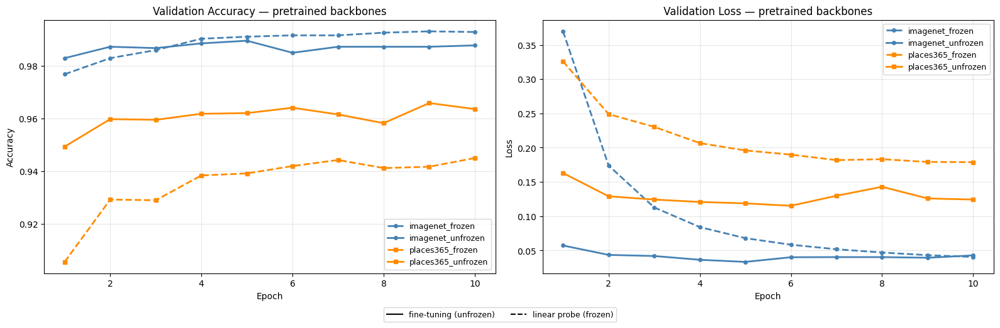

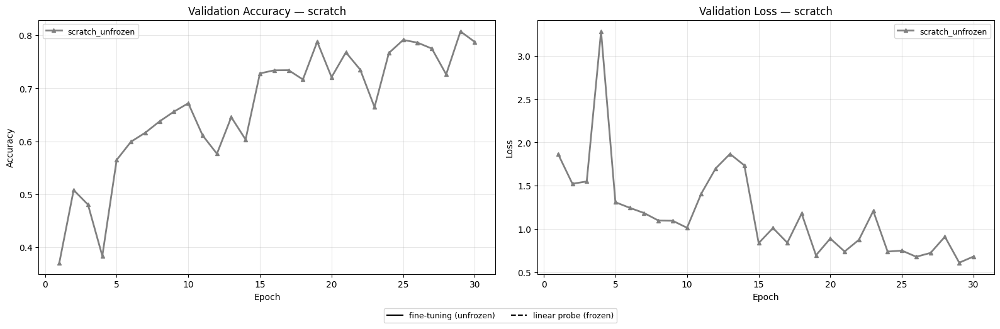

In [24]:
# ── 14. Wykresy wynikow ───────────────────────────────────────────────────────
from matplotlib.lines import Line2D
STYLE = {
    'imagenet_frozen':    dict(color='steelblue',  linestyle='--', linewidth=2, marker='o', markersize=4),
    'places365_frozen':   dict(color='darkorange', linestyle='--', linewidth=2, marker='s', markersize=4),
    'imagenet_unfrozen':  dict(color='steelblue',  linestyle='-',  linewidth=2, marker='o', markersize=4),
    'places365_unfrozen': dict(color='darkorange', linestyle='-',  linewidth=2, marker='s', markersize=4),
    'scratch_unfrozen':   dict(color='gray',       linestyle='-',  linewidth=2, marker='^', markersize=4),
}

legend_elements = [
    Line2D([0], [0], color='black', linestyle='-',  label='fine-tuning (unfrozen)'),
    Line2D([0], [0], color='black', linestyle='--', label='linear probe (frozen)'),
]

def plot_results(df, filename, title_suffix=''):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for name, grp in df.groupby('experiment'):
        axes[0].plot(grp['epoch'], grp['val_acc'], label=name, **STYLE.get(name, {}))
    axes[0].set_title(f'Validation Accuracy {title_suffix}')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
    axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

    for name, grp in df.groupby('experiment'):
        axes[1].plot(grp['epoch'], grp['val_loss'], label=name, **STYLE.get(name, {}))
    axes[1].set_title(f'Validation Loss {title_suffix}')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
    axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

    fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=9,
               bbox_to_anchor=(0.5, -0.05))
    plt.tight_layout()
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()

# wykres 1: imagenet / places365 (frozen + unfrozen)
plot_results(
    results_df[results_df['experiment'] != 'scratch_unfrozen'],
    filename='results_comparison.png',
    title_suffix='— pretrained backbones',
)

# wykres 2: scratch
plot_results(
    scratch_df,
    filename='results_scratch.png',
    title_suffix='— scratch',
)


SPLIT: HKM  (2000 próbek)

=== imagenet_frozen__hkm | backbone=imagenet | frozen=True | epochs=10 ===


  ep 01/10 | train_acc=0.6370 | val_acc=0.9302 | val_loss=1.2982


  ep 02/10 | train_acc=0.9435 | val_acc=0.9526 | val_loss=0.6685


  ep 03/10 | train_acc=0.9630 | val_acc=0.9664 | val_loss=0.3994


  ep 04/10 | train_acc=0.9765 | val_acc=0.9702 | val_loss=0.2888


  ep 05/10 | train_acc=0.9800 | val_acc=0.9717 | val_loss=0.2451


  ep 06/10 | train_acc=0.9855 | val_acc=0.9725 | val_loss=0.2097


  ep 07/10 | train_acc=0.9880 | val_acc=0.9740 | val_loss=0.1840


  ep 08/10 | train_acc=0.9900 | val_acc=0.9743 | val_loss=0.1687


  ep 09/10 | train_acc=0.9925 | val_acc=0.9761 | val_loss=0.1579


  ep 10/10 | train_acc=0.9915 | val_acc=0.9738 | val_loss=0.1463

=== places365_frozen__hkm | backbone=places365 | frozen=True | epochs=10 ===


  ep 01/10 | train_acc=0.6485 | val_acc=0.8395 | val_loss=0.9557


  ep 02/10 | train_acc=0.8595 | val_acc=0.8683 | val_loss=0.6001


  ep 03/10 | train_acc=0.8960 | val_acc=0.8856 | val_loss=0.4798


  ep 04/10 | train_acc=0.9025 | val_acc=0.8915 | val_loss=0.4148


  ep 05/10 | train_acc=0.9155 | val_acc=0.8955 | val_loss=0.3867


  ep 06/10 | train_acc=0.9245 | val_acc=0.9029 | val_loss=0.3514


  ep 07/10 | train_acc=0.9315 | val_acc=0.9014 | val_loss=0.3425


  ep 08/10 | train_acc=0.9235 | val_acc=0.9047 | val_loss=0.3339


  ep 09/10 | train_acc=0.9395 | val_acc=0.9050 | val_loss=0.3201


  ep 10/10 | train_acc=0.9395 | val_acc=0.9022 | val_loss=0.3237

=== imagenet_unfrozen__hkm | backbone=imagenet | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.5825 | val_acc=0.9068 | val_loss=1.2089


  ep 02/10 | train_acc=0.9630 | val_acc=0.9552 | val_loss=0.1950


  ep 03/10 | train_acc=0.9850 | val_acc=0.9620 | val_loss=0.1316


  ep 04/10 | train_acc=0.9935 | val_acc=0.9682 | val_loss=0.1122


  ep 05/10 | train_acc=0.9990 | val_acc=0.9651 | val_loss=0.1095


  ep 06/10 | train_acc=0.9990 | val_acc=0.9666 | val_loss=0.1042


  ep 07/10 | train_acc=0.9990 | val_acc=0.9699 | val_loss=0.0972


  ep 08/10 | train_acc=1.0000 | val_acc=0.9702 | val_loss=0.0981


  ep 09/10 | train_acc=1.0000 | val_acc=0.9687 | val_loss=0.0999


  ep 10/10 | train_acc=1.0000 | val_acc=0.9674 | val_loss=0.1031

=== places365_unfrozen__hkm | backbone=places365 | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.7000 | val_acc=0.8757 | val_loss=0.6083


  ep 02/10 | train_acc=0.9445 | val_acc=0.9146 | val_loss=0.3423


  ep 03/10 | train_acc=0.9795 | val_acc=0.9358 | val_loss=0.2607


  ep 04/10 | train_acc=0.9935 | val_acc=0.9261 | val_loss=0.2609


  ep 05/10 | train_acc=0.9975 | val_acc=0.9317 | val_loss=0.2308


  ep 06/10 | train_acc=0.9985 | val_acc=0.9373 | val_loss=0.2124


  ep 07/10 | train_acc=1.0000 | val_acc=0.9389 | val_loss=0.2087


  ep 08/10 | train_acc=0.9990 | val_acc=0.9373 | val_loss=0.2146


  ep 09/10 | train_acc=1.0000 | val_acc=0.9340 | val_loss=0.2237


  ep 10/10 | train_acc=1.0000 | val_acc=0.9320 | val_loss=0.2277

=== scratch_unfrozen__hkm | backbone=scratch | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.1640 | val_acc=0.0994 | val_loss=2.7690


  ep 02/10 | train_acc=0.2500 | val_acc=0.1541 | val_loss=2.8442


  ep 03/10 | train_acc=0.3425 | val_acc=0.2234 | val_loss=2.3357


  ep 04/10 | train_acc=0.3660 | val_acc=0.3338 | val_loss=1.9023


  ep 05/10 | train_acc=0.4350 | val_acc=0.3103 | val_loss=2.0173


  ep 06/10 | train_acc=0.4635 | val_acc=0.3921 | val_loss=1.8253


  ep 07/10 | train_acc=0.5140 | val_acc=0.3116 | val_loss=2.5263


  ep 08/10 | train_acc=0.5525 | val_acc=0.4102 | val_loss=1.8491


  ep 09/10 | train_acc=0.5705 | val_acc=0.4375 | val_loss=1.7079


  ep 10/10 | train_acc=0.6325 | val_acc=0.4219 | val_loss=1.8560

SPLIT: RANDOM  (2000 próbek)

=== imagenet_frozen__random | backbone=imagenet | frozen=True | epochs=10 ===


  ep 01/10 | train_acc=0.6810 | val_acc=0.9299 | val_loss=1.2787


  ep 02/10 | train_acc=0.9520 | val_acc=0.9557 | val_loss=0.6608


  ep 03/10 | train_acc=0.9715 | val_acc=0.9646 | val_loss=0.4107


  ep 04/10 | train_acc=0.9760 | val_acc=0.9682 | val_loss=0.3060


  ep 05/10 | train_acc=0.9765 | val_acc=0.9697 | val_loss=0.2560


  ep 06/10 | train_acc=0.9840 | val_acc=0.9725 | val_loss=0.2103


  ep 07/10 | train_acc=0.9870 | val_acc=0.9758 | val_loss=0.1824


  ep 08/10 | train_acc=0.9875 | val_acc=0.9753 | val_loss=0.1646


  ep 09/10 | train_acc=0.9935 | val_acc=0.9791 | val_loss=0.1469


  ep 10/10 | train_acc=0.9930 | val_acc=0.9771 | val_loss=0.1419

=== places365_frozen__random | backbone=places365 | frozen=True | epochs=10 ===


  ep 01/10 | train_acc=0.6350 | val_acc=0.8558 | val_loss=0.9459


  ep 02/10 | train_acc=0.8525 | val_acc=0.8690 | val_loss=0.6045


  ep 03/10 | train_acc=0.8780 | val_acc=0.8897 | val_loss=0.4723


  ep 04/10 | train_acc=0.8990 | val_acc=0.8976 | val_loss=0.4100


  ep 05/10 | train_acc=0.9070 | val_acc=0.9065 | val_loss=0.3717


  ep 06/10 | train_acc=0.9090 | val_acc=0.9080 | val_loss=0.3529


  ep 07/10 | train_acc=0.9205 | val_acc=0.9106 | val_loss=0.3264


  ep 08/10 | train_acc=0.9270 | val_acc=0.9146 | val_loss=0.3176


  ep 09/10 | train_acc=0.9355 | val_acc=0.9121 | val_loss=0.3130


  ep 10/10 | train_acc=0.9350 | val_acc=0.9126 | val_loss=0.2980

=== imagenet_unfrozen__random | backbone=imagenet | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.5690 | val_acc=0.9233 | val_loss=1.2923


  ep 02/10 | train_acc=0.9560 | val_acc=0.9562 | val_loss=0.2161


  ep 03/10 | train_acc=0.9810 | val_acc=0.9654 | val_loss=0.1147


  ep 04/10 | train_acc=0.9920 | val_acc=0.9689 | val_loss=0.1053


  ep 05/10 | train_acc=0.9985 | val_acc=0.9722 | val_loss=0.0946


  ep 06/10 | train_acc=0.9975 | val_acc=0.9720 | val_loss=0.0997


  ep 07/10 | train_acc=0.9990 | val_acc=0.9730 | val_loss=0.0928


  ep 08/10 | train_acc=0.9990 | val_acc=0.9740 | val_loss=0.0866


  ep 09/10 | train_acc=1.0000 | val_acc=0.9722 | val_loss=0.0894


  ep 10/10 | train_acc=0.9995 | val_acc=0.9740 | val_loss=0.0892

=== places365_unfrozen__random | backbone=places365 | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.6810 | val_acc=0.8545 | val_loss=0.6312


  ep 02/10 | train_acc=0.9240 | val_acc=0.9164 | val_loss=0.3285


  ep 03/10 | train_acc=0.9755 | val_acc=0.9338 | val_loss=0.2566


  ep 04/10 | train_acc=0.9920 | val_acc=0.9406 | val_loss=0.2157


  ep 05/10 | train_acc=0.9990 | val_acc=0.9429 | val_loss=0.2041


  ep 06/10 | train_acc=0.9990 | val_acc=0.9401 | val_loss=0.1993


  ep 07/10 | train_acc=1.0000 | val_acc=0.9404 | val_loss=0.1949


  ep 08/10 | train_acc=1.0000 | val_acc=0.9419 | val_loss=0.1919


  ep 09/10 | train_acc=1.0000 | val_acc=0.9442 | val_loss=0.1891


  ep 10/10 | train_acc=1.0000 | val_acc=0.9417 | val_loss=0.1920

=== scratch_unfrozen__random | backbone=scratch | frozen=False | epochs=10 ===


  ep 01/10 | train_acc=0.1640 | val_acc=0.0994 | val_loss=2.7327


  ep 02/10 | train_acc=0.2715 | val_acc=0.1549 | val_loss=2.7076


  ep 03/10 | train_acc=0.3390 | val_acc=0.2232 | val_loss=2.2405


  ep 04/10 | train_acc=0.3465 | val_acc=0.3304 | val_loss=1.9280


  ep 05/10 | train_acc=0.3910 | val_acc=0.2573 | val_loss=2.3767


  ep 06/10 | train_acc=0.4245 | val_acc=0.3101 | val_loss=2.1404


  ep 07/10 | train_acc=0.4830 | val_acc=0.3524 | val_loss=1.9087


  ep 08/10 | train_acc=0.5275 | val_acc=0.3995 | val_loss=1.9085


  ep 09/10 | train_acc=0.5495 | val_acc=0.3554 | val_loss=2.4279


  ep 10/10 | train_acc=0.5770 | val_acc=0.4257 | val_loss=1.8055

Zapisano results_full_hkm_random.csv
| base_exp           |     full |      hkm |   random |   Δ_hkm_vs_full |   Δ_random_vs_full |
|:-------------------|---------:|---------:|---------:|----------------:|-------------------:|
| imagenet_frozen    | 0.986497 | 0.976051 | 0.979108 |      -0.0104459 |        -0.00738854 |
| imagenet_unfrozen  | 0.983439 | 0.970191 | 0.974013 |      -0.0132484 |        -0.00942675 |
| places365_frozen   | 0.935287 | 0.904968 | 0.91465  |      -0.0303185 |        -0.0206369  |
| places365_unfrozen | 0.961274 | 0.938854 | 0.944204 |      -0.0224204 |        -0.0170701  |
| scratch_unfrozen   | 0.645605 | 0.437452 | 0.425732 |      -0.208153  |        -0.219873   |


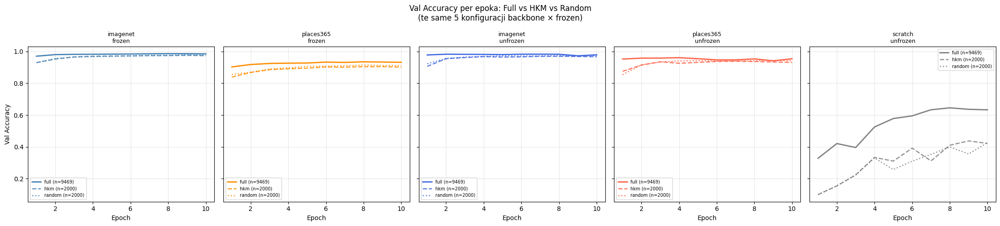

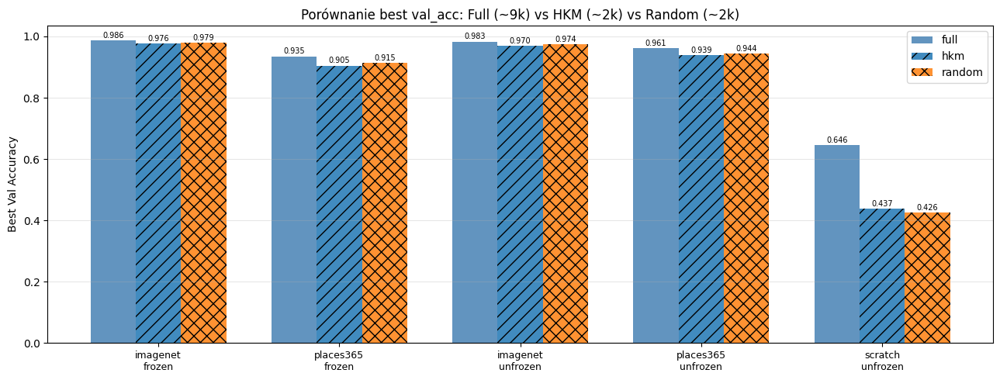

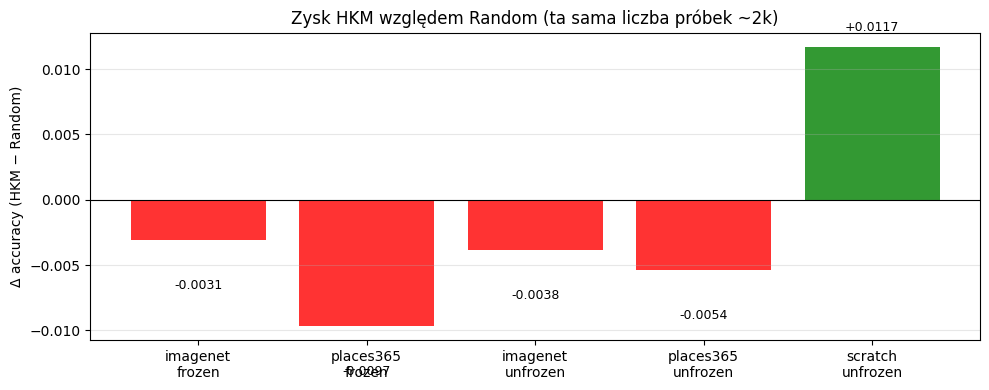

Zapisano: cmp_curves_full_hkm_random.png | cmp_bar_full_hkm_random.png | cmp_delta_hkm_vs_random.png


In [22]:
# ── 15b. Eksperymenty bez scratch ─────────────────────────────────────────────

EPOCHS = 10

experiments_no_scratch = [
    ('imagenet_frozen',   'imagenet',  True),
    ('places365_frozen',  'places365', True),
    ('imagenet_unfrozen', 'imagenet',  False),
    ('places365_unfrozen','places365', False),
]

loaders = [
    ('hkm',    hkm_train_loader,    len(hkm_subset_ds)),
    ('random', random_train_loader, len(random_subset_ds)),
]

subset_results = []
for split_name, loader, n_samp in loaders:
    print(f'\n{"="*60}')
    print(f'SPLIT: {split_name.upper()}  ({n_samp} próbek)')
    print(f'{"="*60}')
    for name, backbone, frozen in experiments_no_scratch:
        exp_label = f'{name}__{split_name}'
        df = run_experiment(exp_label, backbone, frozen, loader, epochs=EPOCHS)
        df['split']     = split_name
        df['n_samples'] = n_samp
        df['base_exp']  = name
        subset_results.append(df)

subset_df = pd.concat(subset_results, ignore_index=True)
subset_df.to_csv('results_subset_no_scratch.csv', index=False)


# ── 15c. Scratch osobno dla HKM i Random (z checkpointami) ───────────────────

EPOCHS_SCRATCH_SUBSET = 30  # można przedłużyć tak samo jak wcześniej

for split_name, loader, n_samp in loaders:
    print(f'\n=== scratch_unfrozen | {split_name.upper()} ({n_samp} próbek) ===')
    scratch_df_split = run_scratch_with_checkpoints(
        total_epochs=EPOCHS_SCRATCH_SUBSET,
        checkpoint_every=10,
        train_loader=loader,
        checkpoint_dir=Path(f'checkpoints_scratch_{split_name}'),
        csv_path=f'results_scratch_{split_name}.csv',
    )

In [21]:
# ── 15. Tabela podsumowujaca ──────────────────────────────────────────────────
summary = (
    results_df
    .groupby('experiment')
    .agg(
        backbone=('backbone', 'first'),
        frozen=('frozen', 'first'),
        best_val_acc=('val_acc', 'max'),
        final_val_acc=('val_acc', 'last'),
        best_epoch=('val_acc', lambda x: x.idxmax() % EPOCHS + 1),
    )
    .reset_index()
    .sort_values('best_val_acc', ascending=False)
)
print(summary.to_markdown(index=False))


| experiment         | backbone   | frozen   |   best_val_acc |   final_val_acc |   best_epoch |
|:-------------------|:-----------|:---------|---------------:|----------------:|-------------:|
| imagenet_frozen    | imagenet   | True     |       0.986497 |        0.985223 |            8 |
| imagenet_unfrozen  | imagenet   | False    |       0.983439 |        0.979108 |            7 |
| places365_unfrozen | places365  | False    |       0.961274 |        0.954395 |            4 |
| places365_frozen   | places365  | True     |       0.935287 |        0.932229 |            8 |
| scratch_unfrozen   | scratch    | False    |       0.645605 |        0.633121 |            8 |


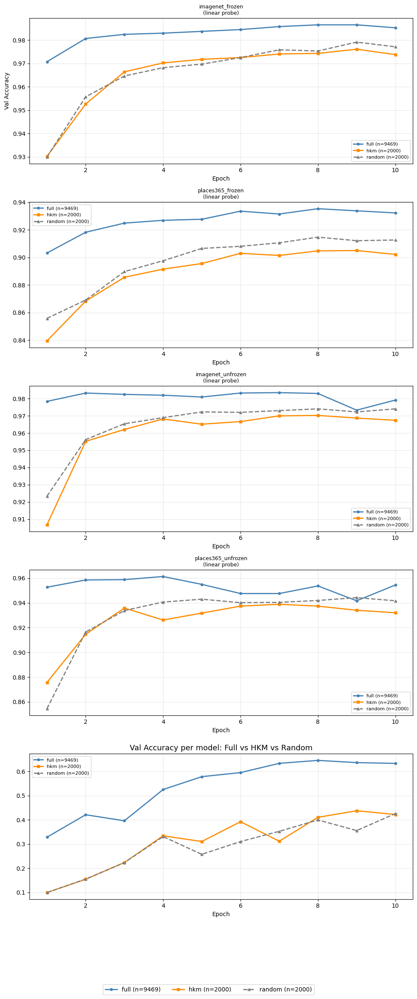

Zapisano results_per_model_splits.png


In [45]:
# ── 14b. Wykresy wynikow: per model, Full vs HKM vs Random ───────────────────
from matplotlib.lines import Line2D

EXPERIMENTS = [
    'imagenet_frozen',
    'places365_frozen',
    'imagenet_unfrozen',
    'places365_unfrozen',
    'scratch_unfrozen',
]

STYLE_SPLIT = {
    'full':   dict(color='steelblue',  linestyle='-',  linewidth=2, marker='o', markersize=4),
    'hkm':    dict(color='darkorange', linestyle='-',  linewidth=2, marker='s', markersize=4),
    'random': dict(color='gray',       linestyle='--', linewidth=2, marker='^', markersize=4),
}

N_FULL   = len(train_model_ds)
N_HKM    = len(hkm_subset_ds)
N_RANDOM = len(random_subset_ds)

SPLIT_LABELS = {
    'full':   f'full (n={N_FULL})',
    'hkm':    f'hkm (n={N_HKM})',
    'random': f'random (n={N_RANDOM})',
}

fig, axes = plt.subplots(5, 1, figsize=(10, 22), sharey=False)

for ax, exp in zip(axes, EXPERIMENTS):
    for split in ['full', 'hkm', 'random']:
        mask = (all_df['base_exp'] == exp) & (all_df['split'] == split)
        grp  = all_df[mask].sort_values('epoch')
        if grp.empty:
            continue
        ax.plot(grp['epoch'], grp['val_acc'], label=SPLIT_LABELS[split], **STYLE_SPLIT[split])

    frozen_label = 'linear probe' if 'frozen' in exp else 'fine-tuning'
    ax.set_title(f'{exp}\n({frozen_label})', fontsize=9)
    ax.set_xlabel('Epoch')
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

axes[0].set_ylabel('Val Accuracy')

legend_elements = [
    Line2D([0], [0], **STYLE_SPLIT['full'],   label=SPLIT_LABELS['full']),
    Line2D([0], [0], **STYLE_SPLIT['hkm'],    label=SPLIT_LABELS['hkm']),
    Line2D([0], [0], **STYLE_SPLIT['random'], label=SPLIT_LABELS['random']),
]
fig.legend(handles=legend_elements, loc='lower center', ncol=3, fontsize=10,
           bbox_to_anchor=(0.5, -0.08))

plt.suptitle('Val Accuracy per model: Full vs HKM vs Random', fontsize=13)
plt.tight_layout()
plt.savefig('results_per_model_splits.png', dpi=150, bbox_inches='tight')
plt.show()
print('Zapisano results_per_model_splits.png')

In [23]:
# ── 16. t-SNE: DINOv2 vs ResNet50-ImageNet ────────────────────────────────────
# Extrakcja cech ResNet50-ImageNet (przed glowa fc — avgpool)
from sklearn.manifold import TSNE

def extract_resnet_features(loader, device, frozen=True):
    """Wyciaga cechy z warstwy avgpool (przed fc) z ResNet50-ImageNet."""
    feat_model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    # Usuwamy ostatnia warstwe fc
    feat_model = nn.Sequential(*list(feat_model.children())[:-1])
    if N_GPUS > 1:
        feat_model = nn.DataParallel(feat_model)
    feat_model = feat_model.to(device)
    feat_model.eval()

    all_feat, all_labels = [], []
    with torch.inference_mode():
        for images, labels in tqdm(loader, desc='ResNet features'):
            images = images.to(device, non_blocking=True)
            feat   = feat_model(images).squeeze(-1).squeeze(-1)  # (B, 2048)
            feat   = F.normalize(feat, dim=1)
            all_feat.append(feat.cpu().numpy())
            all_labels.extend(labels.numpy())
    return np.vstack(all_feat), np.array(all_labels)

resnet_feats, resnet_labels = extract_resnet_features(train_feature_loader, device)
print('ResNet features:', resnet_feats.shape)


ResNet features: 100%|██████████| 74/74 [00:20<00:00,  3.58it/s]

ResNet features: (9469, 2048)


In [24]:
# ── 17. t-SNE ─────────────────────────────────────────────────────────────────
# t-SNE na pelnym zbiorze moze byc wolne — probkujemy 3000 punktow
N_TSNE = 3000
rng    = np.random.default_rng(42)
idx_s  = rng.choice(len(train_embeddings), size=N_TSNE, replace=False)

dino_sample   = train_embeddings[idx_s]
resnet_sample = resnet_feats[idx_s]
labels_sample = train_labels_emb[idx_s]

print('Licze t-SNE dla DINOv2...')
tsne_dino   = TSNE(n_components=2, perplexity=40, random_state=42, n_jobs=-1)
dino_2d     = tsne_dino.fit_transform(dino_sample)

print('Licze t-SNE dla ResNet50-ImageNet...')
tsne_resnet = TSNE(n_components=2, perplexity=40, random_state=42, n_jobs=-1)
resnet_2d   = tsne_resnet.fit_transform(resnet_sample)

print('t-SNE gotowe.')


Licze t-SNE dla DINOv2...
Licze t-SNE dla ResNet50-ImageNet...
t-SNE gotowe.


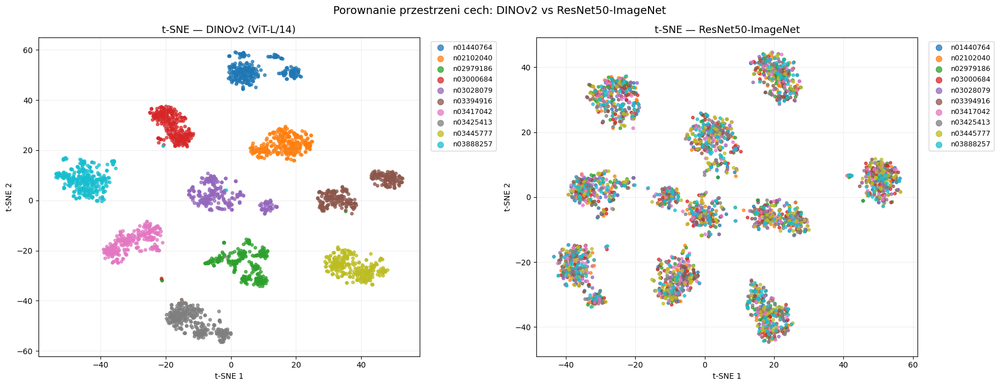

In [25]:
# ── 18. Wizualizacja t-SNE ─────────────────────────────────────────────────────
CLASS_COLORS = plt.cm.tab10(np.linspace(0, 1, num_classes))

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, X_2d, title in [
    (axes[0], dino_2d,   't-SNE — DINOv2 (ViT-L/14)'),
    (axes[1], resnet_2d, 't-SNE — ResNet50-ImageNet'),
]:
    for c in range(num_classes):
        mask = labels_sample == c
        ax.scatter(
            X_2d[mask, 0], X_2d[mask, 1],
            color=CLASS_COLORS[c],
            s=14, alpha=0.75,
            label=train_feature_ds.classes[c]
        )
    ax.set_title(title, fontsize=13)
    ax.set_xlabel('t-SNE 1'); ax.set_ylabel('t-SNE 2')
    ax.legend(markerscale=2, bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
    ax.grid(alpha=0.2)

plt.suptitle('Porownanie przestrzeni cech: DINOv2 vs ResNet50-ImageNet', fontsize=14)
plt.tight_layout()
plt.savefig('tsne_comparison.png', dpi=150, bbox_inches='tight')
plt.show()


In [29]:
def clusters_to_assignments(cluster_list, n_points):
    """
    cluster_list: lista list — cluster_list[k] = indeksy punktów w klastrze k
    Zwraca tablicę (n_points,) gdzie assignments[i] = id klastra punktu i.
    """
    assignments = np.full(n_points, -1, dtype=np.int64)
    for cluster_id, members in enumerate(cluster_list):
        assignments[np.array(members, dtype=np.int64)] = cluster_id
    return assignments

N = len(train_embeddings)

l1_assignments = clusters_to_assignments(cl.clusters[1], N)
l2_assignments = clusters_to_assignments(cl.flat_clusters[2], N)
l3_assignments = clusters_to_assignments(cl.flat_clusters[3], N)

print(f'L1 klastry: {cl.n_clusters[1]}  | unassigned: {(l1_assignments == -1).sum()}')
print(f'L2 klastry: {cl.n_clusters[2]}  | unassigned: {(l2_assignments == -1).sum()}')
print(f'L3 klastry: {cl.n_clusters[3]}  | unassigned: {(l3_assignments == -1).sum()}')

np.savez_compressed(
    'phase2_analysis_data.npz',
    train_embeddings=train_embeddings,
    train_labels=train_labels_emb,
    sampled_indices=np.array(sampled_indices),
    random_indices=np.array(random_indices),
    l1_assignments=l1_assignments,
    l2_assignments=l2_assignments,
    l3_assignments=l3_assignments,
)
print('Zapisano phase2_analysis_data.npz')

L1 klastry: 1000  | unassigned: 0
L2 klastry: 300  | unassigned: 0
L3 klastry: 100  | unassigned: 0
Zapisano phase2_analysis_data.npz


In [25]:
print("hi")

hi


In [23]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 0: Ekstrakcja embeddingów ResNet50-ImageNet
# ══════════════════════════════════════════════════════════════════════════════

import numpy as np
import torch
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader
from tqdm import tqdm

resnet_extractor = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
resnet_extractor.fc = nn.Identity()
resnet_extractor = resnet_extractor.to(device)
resnet_extractor.eval()

extract_loader_train = DataLoader(
    train_model_ds, batch_size=128, shuffle=False,
    num_workers=2, pin_memory=True,
)
extract_loader_val = DataLoader(
    val_ds, batch_size=128, shuffle=False,
    num_workers=2, pin_memory=True,
)

def extract_features(model, loader):
    feats, labels = [], []
    with torch.inference_mode():
        for images, lbls in tqdm(loader, desc='extracting'):
            images = images.to(device, non_blocking=True)
            feats.append(model(images).cpu().numpy())
            labels.append(lbls.numpy())
    return np.concatenate(feats), np.concatenate(labels)

print('Ekstrahuję ResNet feats — train...')
resnet_feats, resnet_labels = extract_features(resnet_extractor, extract_loader_train)

print('Ekstrahuję ResNet feats — val...')
resnet_val_feats, resnet_val_labels = extract_features(resnet_extractor, extract_loader_val)

print(f'resnet_feats:     {resnet_feats.shape}')
print(f'resnet_val_feats: {resnet_val_feats.shape}')

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s] 


Ekstrahuję ResNet feats — train...


extracting: 100%|██████████| 74/74 [00:33<00:00,  2.19it/s]


Ekstrahuję ResNet feats — val...


extracting: 100%|██████████| 31/31 [00:14<00:00,  2.09it/s]

resnet_feats:     (9469, 2048)
resnet_val_feats: (3925, 2048)


In [24]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 1: Generowanie wszystkich subsetów (HKM-DINO, HKM-ResNet, Random)
# ══════════════════════════════════════════════════════════════════════════════

import random
import sys
import numpy as np
import torch

sys.path.insert(0, '/kaggle/working/ssl-data-curation')
np.Inf = np.inf

from src.clusters import HierarchicalCluster
from src import hierarchical_kmeans_gpu as hkmg
from src import hierarchical_sampling as hs

# ── Konfiguracja ──────────────────────────────────────────────────────────────
SEED      = 42
FRACTIONS = [0.05, 0.10, 0.20, 0.40, 0.60, 0.80, 1.00]
N_train   = len(train_labels_emb)
hkm_device = torch.device('cuda:0')

assert torch.cuda.is_available(), 'Wymagane GPU.'

# ── Funkcje pomocnicze ────────────────────────────────────────────────────────
def set_sampling_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

def validate_indices(indices, target, name):
    indices = np.asarray(indices, dtype=np.int64)
    assert len(indices) == target, \
        f'{name}: oczekiwano {target}, otrzymano {len(indices)}'
    assert len(np.unique(indices)) == len(indices), \
        f'{name}: duplikaty indeksów'
    assert indices.min() >= 0 and indices.max() < N_train, \
        f'{name}: indeks poza zakresem'
    return indices

def sample_hkm_indices(cluster_object, target, seed):
    set_sampling_seed(seed)
    indices = hs.hierarchical_sampling(
        cluster_object, target_size=target, sampling_strategy='r'
    )
    return validate_indices(indices, target, 'HKM')

# ── Budowanie HKM-DINO ────────────────────────────────────────────────────────
print('Buduję HKM-DINO...')
set_sampling_seed(SEED)
dino_gpu = torch.tensor(train_embeddings, device=hkm_device, dtype=torch.float32)
cl_dino  = HierarchicalCluster.from_dict(
    hkmg.hierarchical_kmeans_with_resampling(
        data=dino_gpu, n_clusters=[1000, 300, 100],
        n_levels=3, sample_sizes=[5, 3, 2], verbose=True,
    )
)
print('HKM-DINO gotowy.')

# ── Budowanie HKM-ResNet ──────────────────────────────────────────────────────
print('Buduję HKM-ResNet...')
set_sampling_seed(SEED)
resnet_gpu = torch.tensor(resnet_feats, device=hkm_device, dtype=torch.float32)
cl_resnet  = HierarchicalCluster.from_dict(
    hkmg.hierarchical_kmeans_with_resampling(
        data=resnet_gpu, n_clusters=[1000, 300, 100],
        n_levels=3, sample_sizes=[5, 3, 2], verbose=True,
    )
)
print('HKM-ResNet gotowy.')

# ── Generowanie subsetów dla wszystkich frakcji ───────────────────────────────
random_order = np.random.default_rng(SEED).permutation(N_train)
all_subsets  = {}  # klucz: ('hkm_dino' | 'hkm_resnet' | 'random', frac)

for frac in FRACTIONS:
    target = int(round(N_train * frac))
    all_subsets[('hkm_dino',   frac)] = sample_hkm_indices(cl_dino,   target, SEED)
    all_subsets[('hkm_resnet', frac)] = sample_hkm_indices(cl_resnet, target, SEED)
    all_subsets[('random',     frac)] = validate_indices(
        random_order[:target], target, 'Random'
    )
    print(f'frac={frac:.0%} | target={target} — OK')

print('\nWszystkie subsety wygenerowane.')

Buduję HKM-DINO...
Hierarchical k-means resampling steps: 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]
HKM-DINO gotowy.
Buduję HKM-ResNet...
Hierarchical k-means resampling steps: 100%|██████████| 10/10 [00:05<00:00,  1.75it/s]
HKM-ResNet gotowy.
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 2975.63it/s]
frac=5% | target=473 — OK
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 3812.38it/s]
frac=10% | target=947 — OK
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 4462.83it/s]
frac=20% | target=1894 — OK
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 7469.42it/s]
frac=40% | target=3788 — OK
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 6457.84it/s]
frac=60% | target=5681 — OK
Hierarchical sampling from clusters: 100%|██████████| 100/100 [00:00<00:00, 8438.73it/s]
frac=80% | target=7575 — OK
Hierarchical sampling from clusters: 100%|█████████

In [25]:
# ── Zapis subsetów na dysk ─────────────────────────────────────────────────────
import pickle

with open('all_subsets.pkl', 'wb') as f:
    pickle.dump(all_subsets, f)
print('Zapisano all_subsets.pkl')

Zapisano all_subsets.pkl


Obliczam t-SNE dla DINO embeddings...
Obliczam t-SNE dla ResNet embeddings...
t-SNE gotowe.


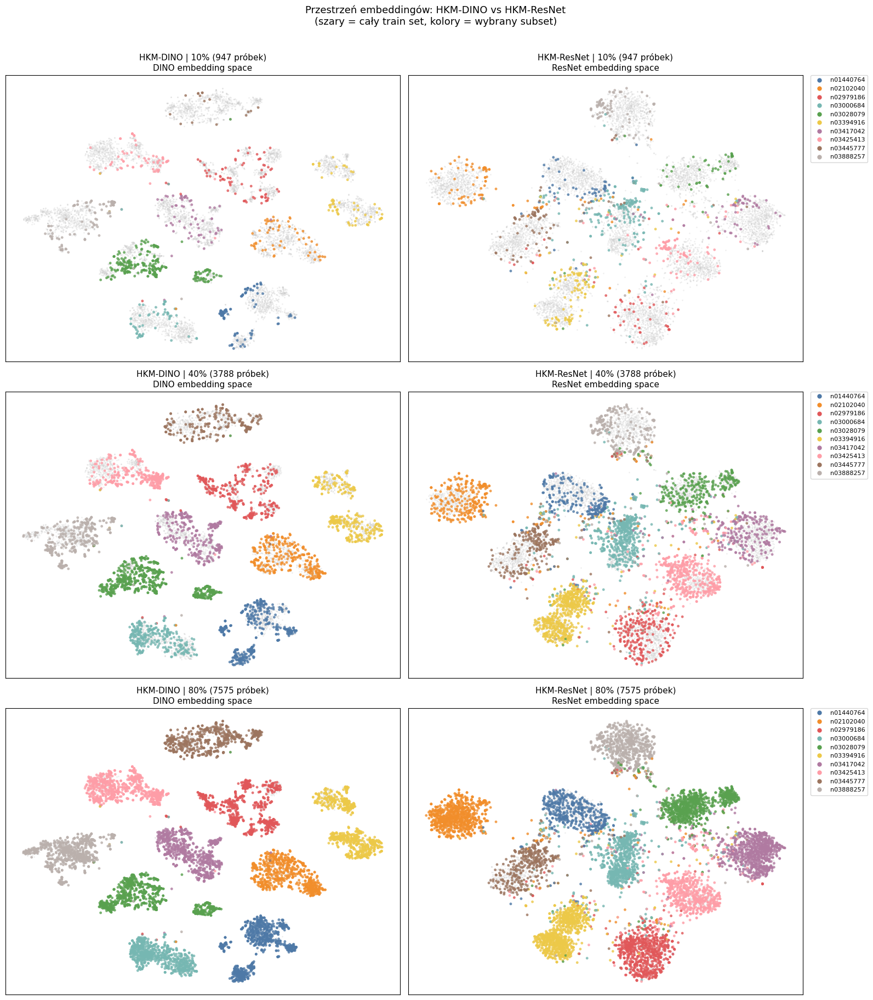

Zapisano tsne_hkm_comparison.png


In [33]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 2: t-SNE — porównanie HKM-DINO vs HKM-ResNet dla 3 frakcji
# ══════════════════════════════════════════════════════════════════════════════

from sklearn.manifold import TSNE

TSNE_FRACTIONS = [0.10, 0.40, 0.80]   # które frakcje wizualizujemy
TSNE_SEED      = 42
CLASS_NAMES    = train_model_ds.classes   # lista nazw klas

# paleta 10 klas Imagenette
PALETTE = np.array([
    '#4e79a7','#f28e2b','#e15759','#76b7b2','#59a14f',
    '#edc948','#b07aa1','#ff9da7','#9c755f','#bab0ac',
])

# ── Oblicz t-SNE raz dla pełnego zbioru (DINO i ResNet) ──────────────────────
print('Obliczam t-SNE dla DINO embeddings...')
tsne_dino = TSNE(n_components=2, perplexity=40, random_state=TSNE_SEED, n_jobs=-1)
dino_2d   = tsne_dino.fit_transform(train_embeddings)   # (N_train, 2)

print('Obliczam t-SNE dla ResNet embeddings...')
tsne_resnet = TSNE(n_components=2, perplexity=40, random_state=TSNE_SEED, n_jobs=-1)
resnet_2d   = tsne_resnet.fit_transform(resnet_feats)   # (N_train, 2)

print('t-SNE gotowe.')

# ── Rysowanie ─────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(
    len(TSNE_FRACTIONS), 2,
    figsize=(16, 6 * len(TSNE_FRACTIONS))
)

for row, frac in enumerate(TSNE_FRACTIONS):
    target = int(round(N_train * frac))
    idx_dino   = all_subsets[('hkm_dino',   frac)]
    idx_resnet = all_subsets[('hkm_resnet', frac)]

    for col, (ax, idx, emb_2d, strategy) in enumerate(zip(
        axes[row],
        [idx_dino,   idx_resnet],
        [dino_2d,    resnet_2d],
        ['HKM-DINO', 'HKM-ResNet'],
    )):
        # tło — cały train set szary
        ax.scatter(
            emb_2d[:, 0], emb_2d[:, 1],
            c='#cccccc', s=4, alpha=0.3, linewidths=0, label='_nolegend_'
        )

        # wybrany subset — kolorowany klasą
        colors_sel = PALETTE[train_labels_emb[idx] % len(PALETTE)]
        sc = ax.scatter(
            emb_2d[idx, 0], emb_2d[idx, 1],
            c=colors_sel, s=12, alpha=0.8, linewidths=0
        )

        ax.set_title(
            f'{strategy} | {frac:.0%} ({target} próbek)\n'
            f'{"DINO" if col == 0 else "ResNet"} embedding space',
            fontsize=11
        )
        ax.set_xticks([]); ax.set_yticks([])

    # legenda klas — tylko po prawej stronie każdego wiersza
    handles = [
        plt.Line2D([0], [0], marker='o', color='w',
                   markerfacecolor=PALETTE[i], markersize=7, label=CLASS_NAMES[i])
        for i in range(len(CLASS_NAMES))
    ]
    axes[row, 1].legend(
        handles=handles, fontsize=8,
        bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0
    )

plt.suptitle(
    'Przestrzeń embeddingów: HKM-DINO vs HKM-ResNet\n'
    '(szary = cały train set, kolory = wybrany subset)',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.savefig('tsne_hkm_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Zapisano tsne_hkm_comparison.png')

In [20]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 3: Interpolacja — trening ResNet50 frozen na pre-generowanych subsetach
# ══════════════════════════════════════════════════════════════════════════════
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset

FRACTIONS = [0.05, 0.10, 0.20, 0.40, 0.60, 0.80, 1.00]
N_train   = len(train_labels_emb)

EPOCHS_INTERP = 10
BATCH_SIZE    = 64

def evaluate_subset_resnet(indices):
    subset_loader = DataLoader(
        Subset(train_model_ds, indices),
        batch_size=BATCH_SIZE, shuffle=True,
        num_workers=2, pin_memory=True,
    )
    model     = create_model('imagenet', frozen=True)
    criterion = nn.CrossEntropyLoss()
    base      = model.module if isinstance(model, nn.DataParallel) else model
    optimizer = torch.optim.AdamW(base.fc.parameters(), lr=1e-3, weight_decay=1e-4)

    for _ in range(EPOCHS_INTERP):
        train_one_epoch(model, subset_loader, optimizer, criterion, frozen=True)

    _, val_acc = evaluate(model, val_loader_exp, criterion)

    # zwolnij pamięć GPU po każdym runie
    del model, optimizer, criterion, subset_loader
    torch.cuda.empty_cache()

    return val_acc

exp_b_results = []

for frac in FRACTIONS:
    target = int(round(N_train * frac))
    print(f'\n{"="*60}')
    print(f'frac={frac:.0%} | target={target}')
    print(f'{"="*60}')

    if target == N_train:
        assert np.array_equal(np.sort(all_subsets[('hkm_dino',   frac)]), np.arange(N_train))
        assert np.array_equal(np.sort(all_subsets[('hkm_resnet', frac)]), np.arange(N_train))
        assert np.array_equal(np.sort(all_subsets[('random',     frac)]), np.arange(N_train))

    print('  Ewaluuję HKM-DINO...')
    acc_hkm_dino   = evaluate_subset_resnet(all_subsets[('hkm_dino',   frac)])

    print('  Ewaluuję HKM-ResNet...')
    acc_hkm_resnet = evaluate_subset_resnet(all_subsets[('hkm_resnet', frac)])

    print('  Ewaluuję Random...')
    acc_random     = evaluate_subset_resnet(all_subsets[('random',     frac)])

    print(f'  HKM-DINO={acc_hkm_dino:.4f} | HKM-ResNet={acc_hkm_resnet:.4f} | Random={acc_random:.4f}')

    exp_b_results.append(dict(
        fraction=frac, n_samples=target,
        hkm_dino_val_acc=acc_hkm_dino,
        hkm_resnet_val_acc=acc_hkm_resnet,
        random_val_acc=acc_random,
    ))

exp_b_df = pd.DataFrame(exp_b_results)
exp_b_df.to_csv('exp_b_interpolation.csv', index=False)
print('\nZapisano exp_b_interpolation.csv')
print(exp_b_df.to_markdown(index=False))


frac=5% | target=473
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9113 | HKM-ResNet=0.9633 | Random=0.9666

frac=10% | target=947
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9633 | HKM-ResNet=0.9850 | Random=0.9801

frac=20% | target=1894
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9875 | HKM-ResNet=0.9898 | Random=0.9862

frac=40% | target=3788
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9916 | HKM-ResNet=0.9921 | Random=0.9901

frac=60% | target=5681
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9926 | HKM-ResNet=0.9926 | Random=0.9924

frac=80% | target=7575
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9934 | HKM-ResNet=0.9926 | Random=0.9918

frac=100% | target=9469
  Ewaluuję HKM-DINO...


  Ewaluuję HKM-ResNet...


  Ewaluuję Random...


  HKM-DINO=0.9941 | HKM-ResNet=0.9929 | Random=0.9939

Zapisano exp_b_interpolation.csv
|   fraction |   n_samples |   hkm_dino_val_acc |   hkm_resnet_val_acc |   random_val_acc |
|-----------:|------------:|-------------------:|---------------------:|-----------------:|
|       0.05 |         473 |           0.911338 |             0.963312 |         0.966624 |
|       0.1  |         947 |           0.963312 |             0.984968 |         0.980127 |
|       0.2  |        1894 |           0.987516 |             0.989809 |         0.986242 |
|       0.4  |        3788 |           0.991592 |             0.992102 |         0.990064 |
|       0.6  |        5681 |           0.992611 |             0.992611 |         0.992357 |
|       0.8  |        7575 |           0.993376 |             0.992611 |         0.991847 |
|       1    |        9469 |           0.99414  |             0.992866 |         0.993885 |


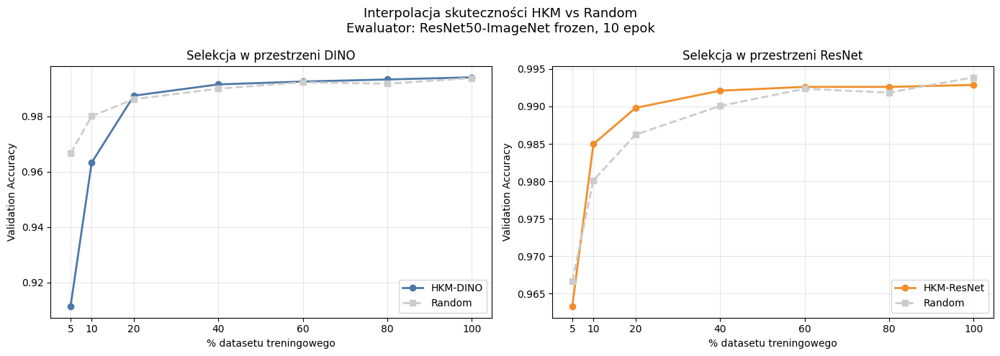

Zapisano exp_b_interpolation_curves.png


In [21]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 4: Wykresy interpolacji — HKM vs Random (DINO / ResNet)
# ══════════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt

exp_b_df = pd.read_csv('exp_b_interpolation.csv')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── Lewy wykres: selekcja w przestrzeni DINO ──────────────────────────────────
axes[0].plot(
    exp_b_df['fraction'] * 100, exp_b_df['hkm_dino_val_acc'],
    marker='o', linewidth=2, color='#4e79a7', label='HKM-DINO',
)
axes[0].plot(
    exp_b_df['fraction'] * 100, exp_b_df['random_val_acc'],
    marker='s', linewidth=2, color='#cccccc', linestyle='--', label='Random',
)
axes[0].set_title('Selekcja w przestrzeni DINO', fontsize=12)
axes[0].set_xlabel('% datasetu treningowego')
axes[0].set_ylabel('Validation Accuracy')
axes[0].set_xticks(exp_b_df['fraction'] * 100)
axes[0].legend(); axes[0].grid(alpha=0.3)

# ── Prawy wykres: selekcja w przestrzeni ResNet ───────────────────────────────
axes[1].plot(
    exp_b_df['fraction'] * 100, exp_b_df['hkm_resnet_val_acc'],
    marker='o', linewidth=2, color='#f28e2b', label='HKM-ResNet',
)
axes[1].plot(
    exp_b_df['fraction'] * 100, exp_b_df['random_val_acc'],
    marker='s', linewidth=2, color='#cccccc', linestyle='--', label='Random',
)
axes[1].set_title('Selekcja w przestrzeni ResNet', fontsize=12)
axes[1].set_xlabel('% datasetu treningowego')
axes[1].set_ylabel('Validation Accuracy')
axes[1].set_xticks(exp_b_df['fraction'] * 100)
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle(
    'Interpolacja skuteczności HKM vs Random\n'
    'Ewaluator: ResNet50-ImageNet frozen, 10 epok',
    fontsize=13,
)
plt.tight_layout()
plt.savefig('exp_b_interpolation_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print('Zapisano exp_b_interpolation_curves.png')

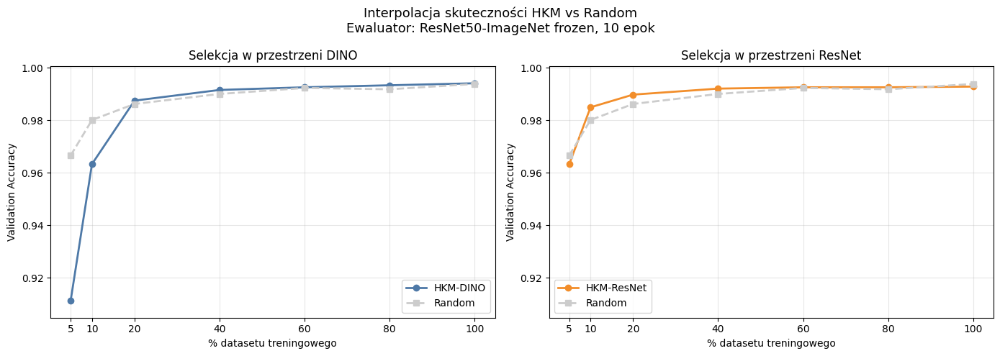

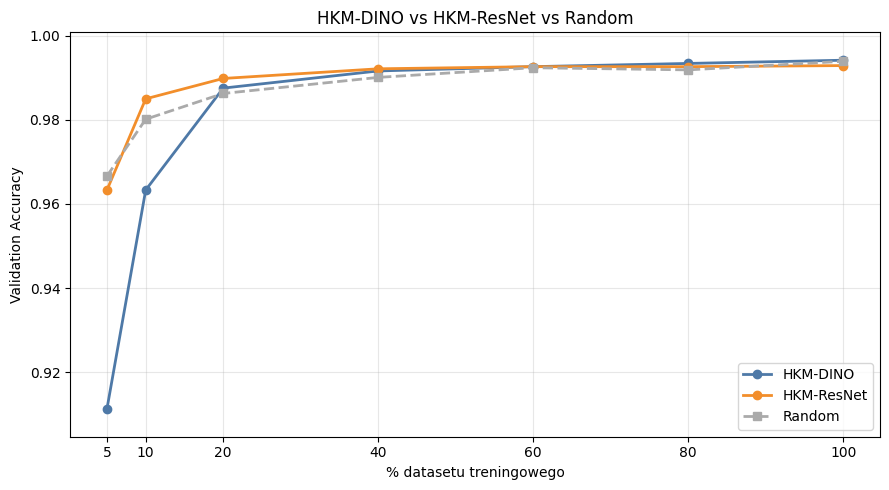

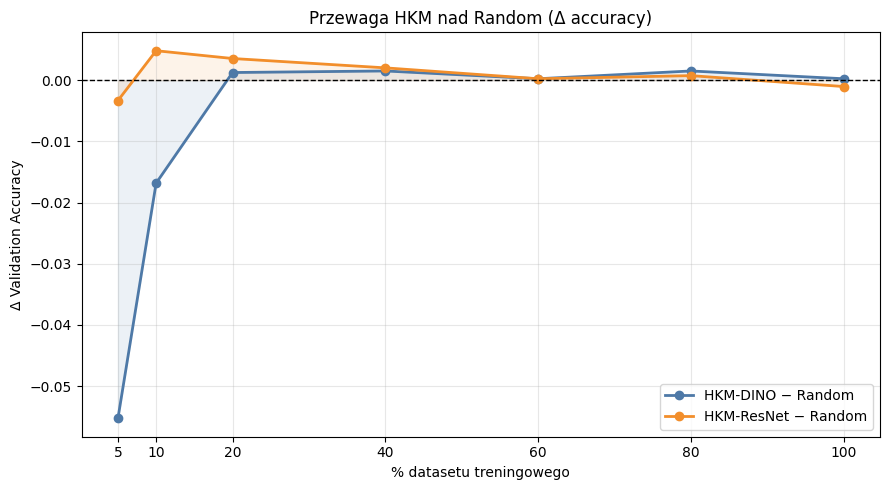

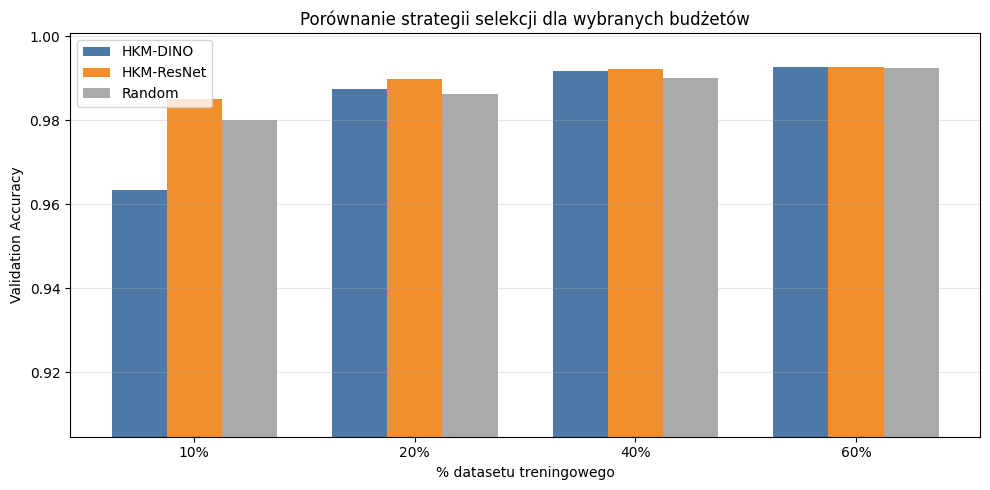

Zapisano: exp_b_interpolation_curves.png, exp_b_all_strategies.png, exp_b_delta.png, exp_b_bar.png


In [22]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 4: Wykresy interpolacji — HKM vs Random (DINO / ResNet)
# ══════════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

exp_b_df = pd.read_csv('exp_b_interpolation.csv')
pct = exp_b_df['fraction'] * 100

# wspólna skala osi Y dla wszystkich wykresów
y_min = exp_b_df[['hkm_dino_val_acc', 'hkm_resnet_val_acc', 'random_val_acc']].min().min()
y_max = exp_b_df[['hkm_dino_val_acc', 'hkm_resnet_val_acc', 'random_val_acc']].max().max()
margin = (y_max - y_min) * 0.08
ylim = (y_min - margin, y_max + margin)

# ── Wykres 1: DINO vs Random / ResNet vs Random (ta sama skala) ───────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(pct, exp_b_df['hkm_dino_val_acc'],   marker='o', linewidth=2, color='#4e79a7', label='HKM-DINO')
axes[0].plot(pct, exp_b_df['random_val_acc'],      marker='s', linewidth=2, color='#cccccc', linestyle='--', label='Random')
axes[0].set_title('Selekcja w przestrzeni DINO', fontsize=12)
axes[0].set_xlabel('% datasetu treningowego'); axes[0].set_ylabel('Validation Accuracy')
axes[0].set_xticks(pct); axes[0].set_ylim(ylim)
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(pct, exp_b_df['hkm_resnet_val_acc'], marker='o', linewidth=2, color='#f28e2b', label='HKM-ResNet')
axes[1].plot(pct, exp_b_df['random_val_acc'],      marker='s', linewidth=2, color='#cccccc', linestyle='--', label='Random')
axes[1].set_title('Selekcja w przestrzeni ResNet', fontsize=12)
axes[1].set_xlabel('% datasetu treningowego'); axes[1].set_ylabel('Validation Accuracy')
axes[1].set_xticks(pct); axes[1].set_ylim(ylim)
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle('Interpolacja skuteczności HKM vs Random\nEwaluator: ResNet50-ImageNet frozen, 10 epok', fontsize=13)
plt.tight_layout()
plt.savefig('exp_b_interpolation_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Wykres 2: wszystkie 3 strategie na jednym wykresie ────────────────────────
fig, ax = plt.subplots(figsize=(9, 5))

ax.plot(pct, exp_b_df['hkm_dino_val_acc'],   marker='o', linewidth=2, color='#4e79a7', label='HKM-DINO')
ax.plot(pct, exp_b_df['hkm_resnet_val_acc'], marker='o', linewidth=2, color='#f28e2b', label='HKM-ResNet')
ax.plot(pct, exp_b_df['random_val_acc'],     marker='s', linewidth=2, color='#aaaaaa', linestyle='--', label='Random')

ax.set_title('HKM-DINO vs HKM-ResNet vs Random', fontsize=12)
ax.set_xlabel('% datasetu treningowego'); ax.set_ylabel('Validation Accuracy')
ax.set_xticks(pct); ax.set_ylim(ylim)
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('exp_b_all_strategies.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Wykres 3: delta (HKM - Random) — gdzie HKM realnie pomaga ────────────────
fig, ax = plt.subplots(figsize=(9, 5))

delta_dino   = exp_b_df['hkm_dino_val_acc']   - exp_b_df['random_val_acc']
delta_resnet = exp_b_df['hkm_resnet_val_acc']  - exp_b_df['random_val_acc']

ax.plot(pct, delta_dino,   marker='o', linewidth=2, color='#4e79a7', label='HKM-DINO − Random')
ax.plot(pct, delta_resnet, marker='o', linewidth=2, color='#f28e2b', label='HKM-ResNet − Random')
ax.axhline(0, color='black', linewidth=1, linestyle='--')
ax.fill_between(pct, delta_dino,   0, alpha=0.10, color='#4e79a7')
ax.fill_between(pct, delta_resnet, 0, alpha=0.10, color='#f28e2b')

ax.set_title('Przewaga HKM nad Random (Δ accuracy)', fontsize=12)
ax.set_xlabel('% datasetu treningowego'); ax.set_ylabel('Δ Validation Accuracy')
ax.set_xticks(pct); ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('exp_b_delta.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Wykres 4: bar chart dla wybranych frakcji ─────────────────────────────────
sel_fracs = [0.10, 0.20, 0.40, 0.60]
sel_df    = exp_b_df[exp_b_df['fraction'].isin(sel_fracs)].reset_index(drop=True)

x     = np.arange(len(sel_df))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(x - width, sel_df['hkm_dino_val_acc'],   width, label='HKM-DINO',   color='#4e79a7')
ax.bar(x,         sel_df['hkm_resnet_val_acc'],  width, label='HKM-ResNet', color='#f28e2b')
ax.bar(x + width, sel_df['random_val_acc'],      width, label='Random',     color='#aaaaaa')

ax.set_xticks(x)
ax.set_xticklabels([f'{int(f*100)}%' for f in sel_df['fraction']])
ax.set_xlabel('% datasetu treningowego'); ax.set_ylabel('Validation Accuracy')
ax.set_title('Porównanie strategii selekcji dla wybranych budżetów', fontsize=12)
ax.set_ylim(ylim); ax.legend(); ax.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('exp_b_bar.png', dpi=150, bbox_inches='tight')
plt.show()

print('Zapisano: exp_b_interpolation_curves.png, exp_b_all_strategies.png, exp_b_delta.png, exp_b_bar.png')

In [23]:
# ── Tabela wyników ────────────────────────────────────────────────────────────
summary = exp_b_df[['fraction', 'n_samples', 'hkm_dino_val_acc', 'hkm_resnet_val_acc', 'random_val_acc']].copy()
summary['fraction']        = (summary['fraction'] * 100).astype(int).astype(str) + '%'
summary['Δ_hkm_dino']     = exp_b_df['hkm_dino_val_acc']   - exp_b_df['random_val_acc']
summary['Δ_hkm_resnet']   = exp_b_df['hkm_resnet_val_acc'] - exp_b_df['random_val_acc']

summary.columns = ['Frakcja', 'N próbek', 'HKM-DINO', 'HKM-ResNet', 'Random', 'Δ HKM-DINO vs Random', 'Δ HKM-ResNet vs Random']

print(summary.to_markdown(index=False, floatfmt='.4f'))

| Frakcja   |   N próbek |   HKM-DINO |   HKM-ResNet |   Random |   Δ HKM-DINO vs Random |   Δ HKM-ResNet vs Random |
|:----------|-----------:|-----------:|-------------:|---------:|-----------------------:|-------------------------:|
| 5%        |        473 |     0.9113 |       0.9633 |   0.9666 |                -0.0553 |                  -0.0033 |
| 10%       |        947 |     0.9633 |       0.9850 |   0.9801 |                -0.0168 |                   0.0048 |
| 20%       |       1894 |     0.9875 |       0.9898 |   0.9862 |                 0.0013 |                   0.0036 |
| 40%       |       3788 |     0.9916 |       0.9921 |   0.9901 |                 0.0015 |                   0.0020 |
| 60%       |       5681 |     0.9926 |       0.9926 |   0.9924 |                 0.0003 |                   0.0003 |
| 80%       |       7575 |     0.9934 |       0.9926 |   0.9918 |                 0.0015 |                   0.0008 |
| 100%      |       9469 |     0.9941 |       0.9929 |  

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# KOMÓRKA 3b: Interpolacja — ResNet scratch (frozen backbone, nowe fc)
# ══════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from pathlib import Path

FRACTIONS     = [0.05, 0.10, 0.20, 0.40, 0.60, 0.80, 1.00]
N_train       = len(train_labels_emb)
EPOCHS_INTERP = 10
BATCH_SIZE    = 64

# ── Wczytaj scratch z ostatniego checkpointu ──────────────────────────────────
def load_scratch_backbone(checkpoint_dir='checkpoints_scratch'):
    ckpts = sorted(Path(checkpoint_dir).glob('scratch_epoch_*.pt'))
    assert ckpts, f'Brak checkpointów w {checkpoint_dir}'
    latest = ckpts[-1]
    print(f'Wczytuję scratch z: {latest}')

    # budujemy pełny model scratch tak samo jak był trenowany
    model = create_model('scratch', frozen=False)
    ckpt  = torch.load(latest, map_location=device)
    model.load_state_dict(ckpt['model_state'])

    # zamrażamy cały backbone
    for p in model.parameters():
        p.requires_grad = False

    # nowa głowica — losowo zainicjalizowana, będzie trenowana na subsecie
    base = model.module if isinstance(model, nn.DataParallel) else model
    base.fc = nn.Linear(base.fc.in_features, base.fc.out_features)

    return model.to(device)

def evaluate_subset_scratch(indices):
    subset_loader = DataLoader(
        Subset(train_model_ds, indices),
        batch_size=BATCH_SIZE, shuffle=True,
        num_workers=2, pin_memory=True,
    )
    # każdy subset dostaje świeżą kopię modelu z zamrożonym backbonem
    model     = load_scratch_backbone()
    criterion = nn.CrossEntropyLoss()
    base      = model.module if isinstance(model, nn.DataParallel) else model
    optimizer = torch.optim.AdamW(base.fc.parameters(), lr=1e-3, weight_decay=1e-4)

    for _ in range(EPOCHS_INTERP):
        train_one_epoch(model, subset_loader, optimizer, criterion, frozen=True)

    _, val_acc = evaluate(model, val_loader_exp, criterion)
    return val_acc

# ── Główna pętla ──────────────────────────────────────────────────────────────
exp_b_scratch_results = []

for frac in FRACTIONS:
    target = int(round(N_train * frac))
    print(f'\n{"="*60}')
    print(f'frac={frac:.0%} | target={target}')
    print(f'{"="*60}')

    print('  Ewaluuję HKM-DINO...')
    acc_hkm_dino   = evaluate_subset_scratch(all_subsets[('hkm_dino',   frac)])

    print('  Ewaluuję HKM-ResNet...')
    acc_hkm_resnet = evaluate_subset_scratch(all_subsets[('hkm_resnet', frac)])

    print('  Ewaluuję Random...')
    acc_random     = evaluate_subset_scratch(all_subsets[('random',     frac)])

    print(f'  HKM-DINO={acc_hkm_dino:.4f} | '
          f'HKM-ResNet={acc_hkm_resnet:.4f} | '
          f'Random={acc_random:.4f}')

    exp_b_scratch_results.append(dict(
        fraction=frac, n_samples=target,
        hkm_dino_val_acc=acc_hkm_dino,
        hkm_resnet_val_acc=acc_hkm_resnet,
        random_val_acc=acc_random,
    ))

exp_b_scratch_df = pd.DataFrame(exp_b_scratch_results)
exp_b_scratch_df.to_csv('exp_b_interpolation_scratch.csv', index=False)
print('\nZapisano exp_b_interpolation_scratch.csv')
print(exp_b_scratch_df.to_markdown(index=False))

In [24]:
# ── 14. Scratch — trening z checkpointami co 10 epok ─────────────────────────
EPOCHS_SCRATCH = 40  # docelowa liczba epok dla scratch — łatwo zmienić
from pathlib import Path
CHECKPOINT_DIR  = Path('checkpoints_scratch')
CHECKPOINT_DIR.mkdir(exist_ok=True)

def find_latest_checkpoint(directory: Path):
    """Zwraca (ścieżka, numer_ostatniej_epoki) lub (None, 0) jeśli brak."""
    ckpts = sorted(directory.glob('scratch_epoch_*.pt'))
    if not ckpts:
        return None, 0
    latest = ckpts[-1]
    epoch  = int(latest.stem.split('_')[-1])
    return latest, epoch

def run_scratch_with_checkpoints(total_epochs=EPOCHS_SCRATCH, checkpoint_every=10):
    criterion = nn.CrossEntropyLoss()

    # ── wznowienie lub start od zera ─────────────────────────────────────────
    ckpt_path, start_epoch = find_latest_checkpoint(CHECKPOINT_DIR)

    model     = create_model('scratch', frozen=False)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
    history   = []

    if ckpt_path is not None:
        print(f'Wznawiam od checkpointu: {ckpt_path}  (epoka {start_epoch})')
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt['model_state'])
        optimizer.load_state_dict(ckpt['optimizer_state'])
        history = ckpt.get('history', [])
    else:
        print('Brak checkpointu — trening od zera.')

    model.to(device)

    print(f'\n=== scratch_unfrozen | epoki {start_epoch+1}–{total_epochs} ===')

    for epoch in range(start_epoch, total_epochs):
        tr_loss, tr_acc = train_one_epoch(
            model, full_train_loader, optimizer, criterion, frozen=False
        )
        va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
        torch.cuda.empty_cache()
        print(f'  ep {epoch+1:03d}/{total_epochs} | '
              f'train_acc={tr_acc:.4f} | val_acc={va_acc:.4f} | '
              f'val_loss={va_loss:.4f}')

        history.append(dict(
            experiment='scratch_unfrozen', backbone='scratch', frozen=False,
            epoch=epoch + 1,
            train_loss=tr_loss, train_acc=tr_acc,
            val_loss=va_loss,   val_acc=va_acc,
        ))

        # checkpoint co N epok (i zawsze ostatnia)
        if (epoch + 1) % checkpoint_every == 0 or (epoch + 1) == total_epochs:
            save_path = CHECKPOINT_DIR / f'scratch_epoch_{epoch+1:04d}.pt'
            torch.save({
                'epoch':           epoch + 1,
                'model_state':     model.state_dict(),
                'optimizer_state': optimizer.state_dict(),
                'history':         history,
            }, save_path)
            print(f'  ✓ checkpoint zapisany → {save_path}')

    scratch_df = pd.DataFrame(history)
    scratch_df.to_csv('results_scratch.csv', index=False)
    print('Zapisano results_scratch.csv')
    final_path = CHECKPOINT_DIR / 'scratch_final_weights.pt'
    base = model.module if isinstance(model, nn.DataParallel) else model
    torch.save(base.state_dict(), final_path)
    print(f'Zapisano wagi modelu → {final_path}')
    print('Zapisano results_scratch.csv')
    return scratch_df, model

scratch_df, scratch_model  = run_scratch_with_checkpoints(total_epochs=EPOCHS_SCRATCH)

Brak checkpointu — trening od zera.

=== scratch_unfrozen | epoki 1–40 ===


  ep 001/40 | train_acc=0.2986 | val_acc=0.3921 | val_loss=1.8582


  ep 002/40 | train_acc=0.4290 | val_acc=0.3975 | val_loss=3.1157


  ep 003/40 | train_acc=0.5033 | val_acc=0.4069 | val_loss=2.3621


  ep 004/40 | train_acc=0.5458 | val_acc=0.5549 | val_loss=1.3832


  ep 005/40 | train_acc=0.5817 | val_acc=0.6168 | val_loss=1.1743


  ep 006/40 | train_acc=0.6050 | val_acc=0.5850 | val_loss=1.2845


  ep 007/40 | train_acc=0.6282 | val_acc=0.7042 | val_loss=1.0090


  ep 008/40 | train_acc=0.6490 | val_acc=0.6222 | val_loss=1.2411


  ep 009/40 | train_acc=0.6567 | val_acc=0.6815 | val_loss=1.2209


  ep 010/40 | train_acc=0.6653 | val_acc=0.5776 | val_loss=2.1138
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0010.pt


  ep 011/40 | train_acc=0.6732 | val_acc=0.6884 | val_loss=0.9536


  ep 012/40 | train_acc=0.6880 | val_acc=0.7162 | val_loss=0.8745


  ep 013/40 | train_acc=0.6997 | val_acc=0.7136 | val_loss=0.8897


  ep 014/40 | train_acc=0.7103 | val_acc=0.7034 | val_loss=0.9443


  ep 015/40 | train_acc=0.7096 | val_acc=0.7417 | val_loss=0.8337


  ep 016/40 | train_acc=0.7277 | val_acc=0.7483 | val_loss=0.8265


  ep 017/40 | train_acc=0.7282 | val_acc=0.6555 | val_loss=1.3590


  ep 018/40 | train_acc=0.7421 | val_acc=0.5704 | val_loss=5.8545


  ep 019/40 | train_acc=0.7336 | val_acc=0.7516 | val_loss=0.8008


  ep 020/40 | train_acc=0.7526 | val_acc=0.7493 | val_loss=0.7753
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0020.pt


  ep 021/40 | train_acc=0.7551 | val_acc=0.7740 | val_loss=0.7702


  ep 022/40 | train_acc=0.7550 | val_acc=0.7536 | val_loss=0.7995


  ep 023/40 | train_acc=0.7559 | val_acc=0.7699 | val_loss=0.8840


  ep 024/40 | train_acc=0.7612 | val_acc=0.8000 | val_loss=0.6648


  ep 025/40 | train_acc=0.7699 | val_acc=0.7755 | val_loss=0.7148


  ep 026/40 | train_acc=0.7767 | val_acc=0.7659 | val_loss=0.7701


  ep 027/40 | train_acc=0.7769 | val_acc=0.7962 | val_loss=0.6438


  ep 028/40 | train_acc=0.7868 | val_acc=0.7389 | val_loss=0.7800


  ep 029/40 | train_acc=0.7927 | val_acc=0.8061 | val_loss=0.6186


  ep 030/40 | train_acc=0.7914 | val_acc=0.7651 | val_loss=0.7736
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0030.pt


  ep 031/40 | train_acc=0.7965 | val_acc=0.7773 | val_loss=0.7316


  ep 032/40 | train_acc=0.7947 | val_acc=0.7167 | val_loss=0.9471


  ep 033/40 | train_acc=0.7984 | val_acc=0.7615 | val_loss=0.8350


  ep 034/40 | train_acc=0.8011 | val_acc=0.7439 | val_loss=0.9654


  ep 035/40 | train_acc=0.8113 | val_acc=0.8217 | val_loss=0.5580


  ep 036/40 | train_acc=0.8110 | val_acc=0.8224 | val_loss=0.5849


  ep 037/40 | train_acc=0.8023 | val_acc=0.7070 | val_loss=0.9877


  ep 038/40 | train_acc=0.8153 | val_acc=0.8110 | val_loss=0.6253


  ep 039/40 | train_acc=0.8188 | val_acc=0.7794 | val_loss=0.7402


  ep 040/40 | train_acc=0.8208 | val_acc=0.8341 | val_loss=0.5262
  ✓ checkpoint zapisany → checkpoints_scratch/scratch_epoch_0040.pt
Zapisano results_scratch.csv
Zapisano wagi modelu → checkpoints_scratch/scratch_final_weights.pt
Zapisano results_scratch.csv


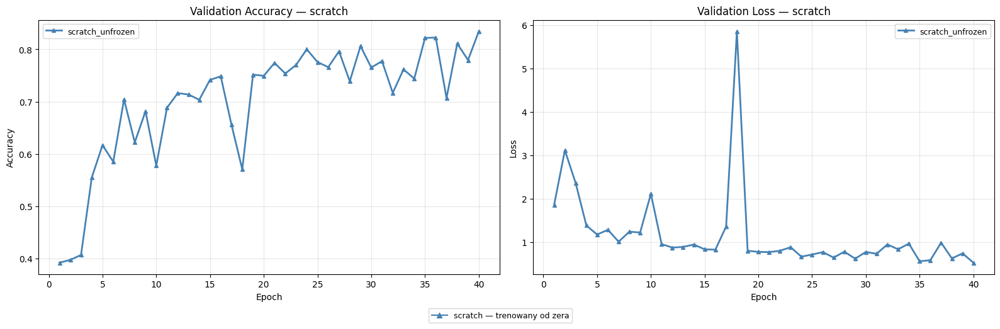

In [25]:
# ── 14. Wykresy wynikow ───────────────────────────────────────────────────────
from matplotlib.lines import Line2D
STYLE = {
    'scratch_unfrozen':   dict(color='steelblue',       linestyle='-',  linewidth=2, marker='^', markersize=4),
}

legend_elements = [
    Line2D([0], [0], color='steelblue', linestyle='-', marker='^',
           markersize=6, label='scratch — trenowany od zera'),
]

def plot_results(df, filename, title_suffix=''):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for name, grp in df.groupby('experiment'):
        axes[0].plot(grp['epoch'], grp['val_acc'], label=name, **STYLE.get(name, {}))
    axes[0].set_title(f'Validation Accuracy {title_suffix}')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
    axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

    for name, grp in df.groupby('experiment'):
        axes[1].plot(grp['epoch'], grp['val_loss'], label=name, **STYLE.get(name, {}))
    axes[1].set_title(f'Validation Loss {title_suffix}')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
    axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

    fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=9,
               bbox_to_anchor=(0.5, -0.05))
    plt.tight_layout()
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()

# wykres 2: scratch
plot_results(
    scratch_df,
    filename='results_scratch.png',
    title_suffix='— scratch',
)

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# Eksperymenty: scratch frozen/unfrozen na HKM-DINO 20%
# ══════════════════════════════════════════════════════════════════════════════

import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import DataLoader, Subset
from pathlib import Path

EPOCHS     = 10
BATCH_SIZE = 64

# ── Loader: HKM-DINO 20% ─────────────────────────────────────────────────────
idx_20 = all_subsets[('hkm_dino', 0.20)]
subset_loader_20 = DataLoader(
    Subset(train_model_ds, idx_20),
    batch_size=BATCH_SIZE, shuffle=True,
    num_workers=2, pin_memory=True,
)
print(f'Subset HKM-DINO 20%: {len(idx_20)} próbek')

# ── Ładowanie scratcha z checkpointu ─────────────────────────────────────────
def load_scratch_model(frozen: bool):
    """Ładuje wytrenowany scratch i ustawia frozen/unfrozen."""
    model = create_model('scratch', frozen=False)  # buduje architekturę
    base  = model.module if isinstance(model, nn.DataParallel) else model

    weights_path = Path('checkpoints_scratch/scratch_final_weights.pt')
    ckpt_path, _ = find_latest_checkpoint(Path('checkpoints_scratch'))

    if weights_path.exists():
        base.load_state_dict(torch.load(weights_path, map_location=device))
        print(f'Wczytano wagi z {weights_path}')
    elif ckpt_path:
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt['model_state'])
        print(f'Wczytano wagi z {ckpt_path}')
    else:
        raise FileNotFoundError('Brak zapisanego modelu scratch.')

    if frozen:
        for p in model.parameters():
            p.requires_grad = False
        # nowa głowica — losowo zainicjalizowana
        base.fc = nn.Linear(base.fc.in_features, base.fc.out_features).to(device)
        print('Tryb: frozen (tylko fc trenowane)')
    else:
        print('Tryb: unfrozen (cały model fine-tuning)')

    return model.to(device)

# ── Eksperyment ───────────────────────────────────────────────────────────────
def run_scratch_experiment(name, frozen):
    print(f'\n=== {name} | frozen={frozen} | epochs={EPOCHS} ===')
    model     = load_scratch_model(frozen=frozen)
    criterion = nn.CrossEntropyLoss()
    base      = model.module if isinstance(model, nn.DataParallel) else model

    if frozen:
        optimizer = torch.optim.AdamW(
            base.fc.parameters(), lr=1e-3, weight_decay=1e-4
        )
    else:
        optimizer = torch.optim.AdamW([
            {'params': base.layer1.parameters(), 'lr': 1e-5},
            {'params': base.layer2.parameters(), 'lr': 1e-5},
            {'params': base.layer3.parameters(), 'lr': 1e-4},
            {'params': base.layer4.parameters(), 'lr': 1e-4},
            {'params': base.fc.parameters(),     'lr': 1e-3},
        ], weight_decay=1e-4)

    history = []
    for epoch in range(EPOCHS):
        tr_loss, tr_acc = train_one_epoch(
            model, subset_loader_20, optimizer, criterion, frozen=frozen
        )
        va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
        torch.cuda.empty_cache()

        print(f'  ep {epoch+1:02d}/{EPOCHS} | '
              f'train_acc={tr_acc:.4f} | val_acc={va_acc:.4f} | '
              f'val_loss={va_loss:.4f}')

        history.append(dict(
            experiment=name, frozen=frozen,
            epoch=epoch + 1,
            train_loss=tr_loss, train_acc=tr_acc,
            val_loss=va_loss,   val_acc=va_acc,
        ))

    del model, optimizer, criterion
    torch.cuda.empty_cache()

    return pd.DataFrame(history)

# ── Uruchomienie ──────────────────────────────────────────────────────────────
df_scratch_frozen   = run_scratch_experiment('scratch_frozen',   frozen=True)
df_scratch_unfrozen = run_scratch_experiment('scratch_unfrozen', frozen=False)

scratch_exp_df = pd.concat([df_scratch_frozen, df_scratch_unfrozen], ignore_index=True)
scratch_exp_df.to_csv('results_scratch_experiments.csv', index=False)
print('\nZapisano results_scratch_experiments.csv')
print(scratch_exp_df.groupby('experiment')[['val_acc']].max().sort_values('val_acc', ascending=False))

In [27]:
# ══════════════════════════════════════════════════════════════════════════════
# Scratch: stopniowe odmrażanie — 4 konfiguracje × 2 subsety
# ══════════════════════════════════════════════════════════════════════════════

import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import DataLoader, Subset
from pathlib import Path

EPOCHS     = 10
BATCH_SIZE = 64

# ── Konfiguracje odmrażania (od najmniej do najwięcej) ────────────────────────
UNFREEZE_CONFIGS = [
    ('fc_only',              ['fc']),
    ('fc_layer4',            ['fc', 'layer4']),
    ('fc_layer4_layer3',     ['fc', 'layer4', 'layer3']),
    ('fc_layer4_layer3_layer2', ['fc', 'layer4', 'layer3', 'layer2']),
]

# LR per warstwa — im głębiej tym mniej
LAYER_LR = {
    'layer1': 1e-5,
    'layer2': 1e-5,
    'layer3': 1e-4,
    'layer4': 1e-4,
    'fc':     1e-3,
}

# ── Loadery ───────────────────────────────────────────────────────────────────
idx_hkm_20    = all_subsets[('hkm_dino', 0.20)]
idx_random_20 = all_subsets[('random',   0.20)]

loaders_cfg = [
    ('hkm_dino_20pct', DataLoader(Subset(train_model_ds, idx_hkm_20),
                                  batch_size=BATCH_SIZE, shuffle=True,
                                  num_workers=2, pin_memory=True), len(idx_hkm_20)),
    ('random_20pct',   DataLoader(Subset(train_model_ds, idx_random_20),
                                  batch_size=BATCH_SIZE, shuffle=True,
                                  num_workers=2, pin_memory=True), len(idx_random_20)),
]

# ── Ładowanie scratcha z wybranym zestawem odmrożonych warstw ─────────────────
def load_scratch_unfreeze(unfreeze_layers: list):
    model = create_model('scratch', frozen=False)
    base  = model.module if isinstance(model, nn.DataParallel) else model

    base.load_state_dict(torch.load(
        '/kaggle/input/models/dominika2024/scratch/pytorch/default/1/scratch_final_weights.pt',
        map_location=device
    ))

    for p in base.parameters():
        p.requires_grad = False
    for layer_name in unfreeze_layers:
        for p in getattr(base, layer_name).parameters():
            p.requires_grad = True

    return model.to(device)

def build_optimizer(base, unfreeze_layers):
    param_groups = [
        {'params': getattr(base, l).parameters(), 'lr': LAYER_LR[l]}
        for l in unfreeze_layers
    ]
    return torch.optim.AdamW(param_groups, weight_decay=1e-4)

# ── Główna pętla ──────────────────────────────────────────────────────────────
partial_results = []

for config_name, unfreeze_layers in UNFREEZE_CONFIGS:
    for split_name, loader, n_samples in loaders_cfg:
        exp_name = f'scratch_{config_name}__{split_name}'
        print(f'\n{"="*60}')
        print(f'{exp_name}')
        print(f'odmrożone: {unfreeze_layers} | n={n_samples}')
        print(f'{"="*60}')

        model     = load_scratch_unfreeze(unfreeze_layers)
        base      = model.module if isinstance(model, nn.DataParallel) else model
        criterion = nn.CrossEntropyLoss()
        optimizer = build_optimizer(base, unfreeze_layers)

        for epoch in range(EPOCHS):
            tr_loss, tr_acc = train_one_epoch(
                model, loader, optimizer, criterion, frozen=False
            )
            va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
            torch.cuda.empty_cache()

            print(f'  ep {epoch+1:02d}/{EPOCHS} | '
                  f'train_acc={tr_acc:.4f} | val_acc={va_acc:.4f} | '
                  f'val_loss={va_loss:.4f}')

            partial_results.append(dict(
                experiment=exp_name,
                config=config_name,
                split=split_name,
                unfrozen_layers='+'.join(unfreeze_layers),
                n_samples=n_samples,
                epoch=epoch + 1,
                train_loss=tr_loss, train_acc=tr_acc,
                val_loss=va_loss,   val_acc=va_acc,
            ))

        del model, optimizer, criterion
        torch.cuda.empty_cache()

        # zapis po każdym runie — zabezpieczenie przed OOM
        pd.DataFrame(partial_results).to_csv('results_scratch_partial.csv', index=False)
        print(f'  ✓ zapisano CSV ({exp_name})')

partial_df = pd.DataFrame(partial_results)
print('\nPodsumowanie (best val_acc):')
print(
    partial_df.groupby(['config', 'split'])[['val_acc']]
    .max()
    .sort_values('val_acc', ascending=False)
    .to_string()
)


scratch_fc_only__hkm_dino_20pct
odmrożone: ['fc'] | n=1894


  ep 01/10 | train_acc=0.7286 | val_acc=0.8227 | val_loss=0.9426


  ep 02/10 | train_acc=0.7408 | val_acc=0.8413 | val_loss=0.5002


  ep 03/10 | train_acc=0.7592 | val_acc=0.8568 | val_loss=0.4607


  ep 04/10 | train_acc=0.7645 | val_acc=0.8568 | val_loss=0.5031


  ep 05/10 | train_acc=0.7825 | val_acc=0.8599 | val_loss=0.4495


  ep 06/10 | train_acc=0.7761 | val_acc=0.8265 | val_loss=0.6614


  ep 07/10 | train_acc=0.7730 | val_acc=0.8596 | val_loss=0.4488


  ep 08/10 | train_acc=0.7777 | val_acc=0.8566 | val_loss=0.4693


  ep 09/10 | train_acc=0.7608 | val_acc=0.8512 | val_loss=0.4608


  ep 10/10 | train_acc=0.7603 | val_acc=0.8601 | val_loss=0.4475
  ✓ zapisano CSV (scratch_fc_only__hkm_dino_20pct)

scratch_fc_only__random_20pct
odmrożone: ['fc'] | n=1894


  ep 01/10 | train_acc=0.8073 | val_acc=0.8670 | val_loss=0.4348


  ep 02/10 | train_acc=0.8226 | val_acc=0.8619 | val_loss=0.4459


  ep 03/10 | train_acc=0.8210 | val_acc=0.8583 | val_loss=0.4357


  ep 04/10 | train_acc=0.8173 | val_acc=0.8657 | val_loss=0.4298


  ep 05/10 | train_acc=0.8200 | val_acc=0.8596 | val_loss=0.4364


  ep 06/10 | train_acc=0.8353 | val_acc=0.8530 | val_loss=0.4733


  ep 07/10 | train_acc=0.8189 | val_acc=0.8639 | val_loss=0.4318


  ep 08/10 | train_acc=0.8173 | val_acc=0.8507 | val_loss=0.4945


  ep 09/10 | train_acc=0.8215 | val_acc=0.8657 | val_loss=0.4197


  ep 10/10 | train_acc=0.8242 | val_acc=0.8604 | val_loss=0.4391
  ✓ zapisano CSV (scratch_fc_only__random_20pct)

scratch_fc_layer4__hkm_dino_20pct
odmrożone: ['fc', 'layer4'] | n=1894


  ep 01/10 | train_acc=0.7439 | val_acc=0.8591 | val_loss=0.4612


  ep 02/10 | train_acc=0.7624 | val_acc=0.8538 | val_loss=0.4599


  ep 03/10 | train_acc=0.7550 | val_acc=0.8538 | val_loss=0.4604


  ep 04/10 | train_acc=0.7677 | val_acc=0.8576 | val_loss=0.4550


  ep 05/10 | train_acc=0.7767 | val_acc=0.8535 | val_loss=0.4797


  ep 06/10 | train_acc=0.7767 | val_acc=0.8497 | val_loss=0.4885


  ep 07/10 | train_acc=0.7835 | val_acc=0.8459 | val_loss=0.4923


  ep 08/10 | train_acc=0.7825 | val_acc=0.8296 | val_loss=0.6634


  ep 09/10 | train_acc=0.7656 | val_acc=0.8431 | val_loss=0.5093


  ep 10/10 | train_acc=0.7804 | val_acc=0.8532 | val_loss=0.4695
  ✓ zapisano CSV (scratch_fc_layer4__hkm_dino_20pct)

scratch_fc_layer4__random_20pct
odmrożone: ['fc', 'layer4'] | n=1894


  ep 01/10 | train_acc=0.8068 | val_acc=0.8601 | val_loss=0.4433


  ep 02/10 | train_acc=0.8321 | val_acc=0.8634 | val_loss=0.4352


  ep 03/10 | train_acc=0.8189 | val_acc=0.8504 | val_loss=0.4897


  ep 04/10 | train_acc=0.8205 | val_acc=0.8609 | val_loss=0.4379


  ep 05/10 | train_acc=0.8268 | val_acc=0.8673 | val_loss=0.4241


  ep 06/10 | train_acc=0.8284 | val_acc=0.8637 | val_loss=0.4285


  ep 07/10 | train_acc=0.8263 | val_acc=0.8637 | val_loss=0.4337


  ep 08/10 | train_acc=0.8173 | val_acc=0.8606 | val_loss=0.4346


  ep 09/10 | train_acc=0.8300 | val_acc=0.8675 | val_loss=0.4261


  ep 10/10 | train_acc=0.8405 | val_acc=0.8657 | val_loss=0.4351
  ✓ zapisano CSV (scratch_fc_layer4__random_20pct)

scratch_fc_layer4_layer3__hkm_dino_20pct
odmrożone: ['fc', 'layer4', 'layer3'] | n=1894


  ep 01/10 | train_acc=0.7503 | val_acc=0.8502 | val_loss=0.4697


  ep 02/10 | train_acc=0.7566 | val_acc=0.8428 | val_loss=0.5296


  ep 03/10 | train_acc=0.7804 | val_acc=0.8655 | val_loss=0.4429


  ep 04/10 | train_acc=0.7772 | val_acc=0.8591 | val_loss=0.4541


  ep 05/10 | train_acc=0.7814 | val_acc=0.8471 | val_loss=0.4928


  ep 06/10 | train_acc=0.7846 | val_acc=0.8609 | val_loss=0.4451


  ep 07/10 | train_acc=0.7920 | val_acc=0.8624 | val_loss=0.4317


  ep 08/10 | train_acc=0.8036 | val_acc=0.8611 | val_loss=0.4428


  ep 09/10 | train_acc=0.7846 | val_acc=0.8668 | val_loss=0.4788


  ep 10/10 | train_acc=0.7941 | val_acc=0.8655 | val_loss=0.4535
  ✓ zapisano CSV (scratch_fc_layer4_layer3__hkm_dino_20pct)

scratch_fc_layer4_layer3__random_20pct
odmrożone: ['fc', 'layer4', 'layer3'] | n=1894


  ep 01/10 | train_acc=0.8141 | val_acc=0.8726 | val_loss=0.4113


  ep 02/10 | train_acc=0.8295 | val_acc=0.8680 | val_loss=0.4254


  ep 03/10 | train_acc=0.8384 | val_acc=0.8782 | val_loss=0.3911


  ep 04/10 | train_acc=0.8342 | val_acc=0.8701 | val_loss=0.4106


  ep 05/10 | train_acc=0.8416 | val_acc=0.8611 | val_loss=0.4487


  ep 06/10 | train_acc=0.8442 | val_acc=0.8754 | val_loss=0.3948


  ep 07/10 | train_acc=0.8421 | val_acc=0.8767 | val_loss=0.4122


  ep 08/10 | train_acc=0.8453 | val_acc=0.8736 | val_loss=0.4117


  ep 09/10 | train_acc=0.8511 | val_acc=0.8721 | val_loss=0.4270


  ep 10/10 | train_acc=0.8432 | val_acc=0.8614 | val_loss=0.4753
  ✓ zapisano CSV (scratch_fc_layer4_layer3__random_20pct)

scratch_fc_layer4_layer3_layer2__hkm_dino_20pct
odmrożone: ['fc', 'layer4', 'layer3', 'layer2'] | n=1894


  ep 01/10 | train_acc=0.7429 | val_acc=0.8561 | val_loss=0.4646


  ep 02/10 | train_acc=0.7661 | val_acc=0.8553 | val_loss=0.4636


  ep 03/10 | train_acc=0.7740 | val_acc=0.8561 | val_loss=0.4635


  ep 04/10 | train_acc=0.7677 | val_acc=0.8632 | val_loss=0.4325


  ep 05/10 | train_acc=0.7798 | val_acc=0.8591 | val_loss=0.4533


  ep 06/10 | train_acc=0.7994 | val_acc=0.8484 | val_loss=0.5209


  ep 07/10 | train_acc=0.7936 | val_acc=0.8326 | val_loss=0.7977


  ep 08/10 | train_acc=0.8031 | val_acc=0.8456 | val_loss=0.5176


  ep 09/10 | train_acc=0.8184 | val_acc=0.8397 | val_loss=0.5692


  ep 10/10 | train_acc=0.7925 | val_acc=0.8535 | val_loss=0.4701
  ✓ zapisano CSV (scratch_fc_layer4_layer3_layer2__hkm_dino_20pct)

scratch_fc_layer4_layer3_layer2__random_20pct
odmrożone: ['fc', 'layer4', 'layer3', 'layer2'] | n=1894


  ep 01/10 | train_acc=0.8157 | val_acc=0.8680 | val_loss=0.4098


  ep 02/10 | train_acc=0.8427 | val_acc=0.8622 | val_loss=0.4271


  ep 03/10 | train_acc=0.8432 | val_acc=0.8611 | val_loss=0.4370


  ep 04/10 | train_acc=0.8316 | val_acc=0.8662 | val_loss=0.4190


  ep 05/10 | train_acc=0.8448 | val_acc=0.8787 | val_loss=0.3940


  ep 06/10 | train_acc=0.8395 | val_acc=0.8780 | val_loss=0.3912


  ep 07/10 | train_acc=0.8379 | val_acc=0.8673 | val_loss=0.4269


  ep 08/10 | train_acc=0.8395 | val_acc=0.8668 | val_loss=0.4583


  ep 09/10 | train_acc=0.8606 | val_acc=0.8701 | val_loss=0.4139


  ep 10/10 | train_acc=0.8506 | val_acc=0.8762 | val_loss=0.4047
  ✓ zapisano CSV (scratch_fc_layer4_layer3_layer2__random_20pct)

Podsumowanie (best val_acc):
                                         val_acc
config                  split                   
fc_layer4_layer3_layer2 random_20pct    0.878726
fc_layer4_layer3        random_20pct    0.878217
fc_layer4               random_20pct    0.867516
fc_only                 random_20pct    0.867006
fc_layer4_layer3        hkm_dino_20pct  0.866752
fc_layer4_layer3_layer2 hkm_dino_20pct  0.863185
fc_only                 hkm_dino_20pct  0.860127
fc_layer4               hkm_dino_20pct  0.859108


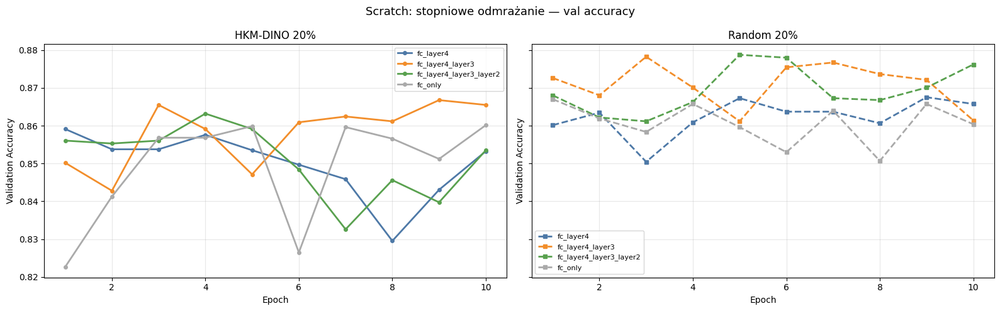

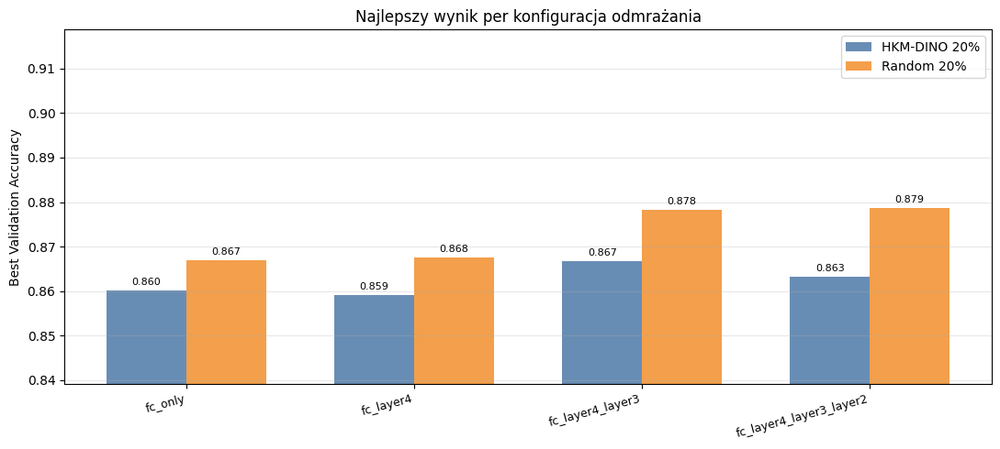

/tmp/ipykernel_57/3822871387.py:102: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(configs, rotation=15, ha='right', fontsize=9)


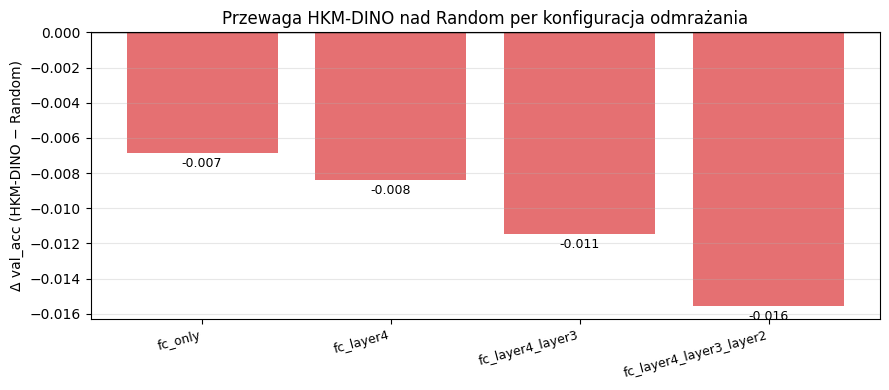

Zapisano: scratch_partial_curves.png, scratch_partial_bar.png, scratch_partial_delta.png


In [28]:
# ── Wykresy: porównanie konfiguracji odmrażania na 2 subsetach ────────────────

import matplotlib.pyplot as plt
import pandas as pd

try:
    partial_df
except NameError:
    partial_df = pd.read_csv('results_scratch_partial.csv')

COLOR_CONFIG = {
    'fc_only':                  '#aaaaaa',
    'fc_layer4':                '#4e79a7',
    'fc_layer4_layer3':         '#f28e2b',
    'fc_layer4_layer3_layer2':  '#59a14f',
}
STYLE_SPLIT = {
    'hkm_dino_20pct': dict(linestyle='-',  marker='o', markersize=4),
    'random_20pct':   dict(linestyle='--', marker='s', markersize=4),
}

# ── Wykres 1: krzywe val_acc po epokach ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

SPLIT_TITLES = {
    'hkm_dino_20pct': 'HKM-DINO 20%',
    'random_20pct':   'Random 20%',
}

for col, split in enumerate(['hkm_dino_20pct', 'random_20pct']):
    ax  = axes[col]
    grp = partial_df[partial_df['split'] == split]
    for config, cgrp in grp.groupby('config'):
        ax.plot(
            cgrp['epoch'], cgrp['val_acc'],
            color=COLOR_CONFIG.get(config, 'black'),
            label=config, linewidth=2,
            **{k: v for k, v in STYLE_SPLIT[split].items()},
        )
    ax.set_title(SPLIT_TITLES[split], fontsize=12)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Validation Accuracy')
    ax.legend(fontsize=8); ax.grid(alpha=0.3)

plt.suptitle('Scratch: stopniowe odmrażanie — val accuracy', fontsize=13)
plt.tight_layout()
plt.savefig('scratch_partial_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Wykres 2: bar chart best val_acc per konfiguracja ─────────────────────────
import numpy as np

best = (
    partial_df.groupby(['config', 'split'])['val_acc']
    .max()
    .reset_index()
)

configs = [c for c, _ in UNFREEZE_CONFIGS]
splits  = ['hkm_dino_20pct', 'random_20pct']
x       = np.arange(len(configs))
width   = 0.35

fig, ax = plt.subplots(figsize=(11, 5))

for i, split in enumerate(splits):
    vals = [
        best.loc[(best['config'] == c) & (best['split'] == split), 'val_acc'].values[0]
        for c in configs
    ]
    offset = (i - 0.5) * width
    bars = ax.bar(x + offset, vals, width, label=SPLIT_TITLES[split],
                  color=['#4e79a7', '#f28e2b'][i], alpha=0.85)
    ax.bar_label(bars, fmt='%.3f', fontsize=8, padding=3)

ax.set_xticks(x)
ax.set_xticklabels(configs, rotation=15, ha='right', fontsize=9)
ax.set_ylabel('Best Validation Accuracy')
ax.set_title('Najlepszy wynik per konfiguracja odmrażania', fontsize=12)
ax.legend(); ax.grid(alpha=0.3, axis='y')

y_min = best['val_acc'].min()
ax.set_ylim(y_min - 0.02, best['val_acc'].max() + 0.04)

plt.tight_layout()
plt.savefig('scratch_partial_bar.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Wykres 3: delta HKM-DINO vs Random per konfiguracja ──────────────────────
fig, ax = plt.subplots(figsize=(9, 4))

hkm_vals    = best[best['split'] == 'hkm_dino_20pct'].set_index('config')['val_acc']
random_vals = best[best['split'] == 'random_20pct'].set_index('config')['val_acc']
deltas      = (hkm_vals - random_vals).reindex(configs)

colors = ['#4e79a7' if d >= 0 else '#e15759' for d in deltas]
bars   = ax.bar(configs, deltas, color=colors, alpha=0.85)
ax.bar_label(bars, fmt='%.3f', fontsize=9, padding=3)
ax.axhline(0, color='black', linewidth=1)
ax.set_ylabel('Δ val_acc (HKM-DINO − Random)')
ax.set_title('Przewaga HKM-DINO nad Random per konfiguracja odmrażania', fontsize=12)
ax.set_xticklabels(configs, rotation=15, ha='right', fontsize=9)
ax.grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('scratch_partial_delta.png', dpi=150, bbox_inches='tight')
plt.show()

print('Zapisano: scratch_partial_curves.png, scratch_partial_bar.png, scratch_partial_delta.png')

Najlepszy model: config=fc_layer4_layer3_layer2 | split=random_20pct | val_acc=0.8787


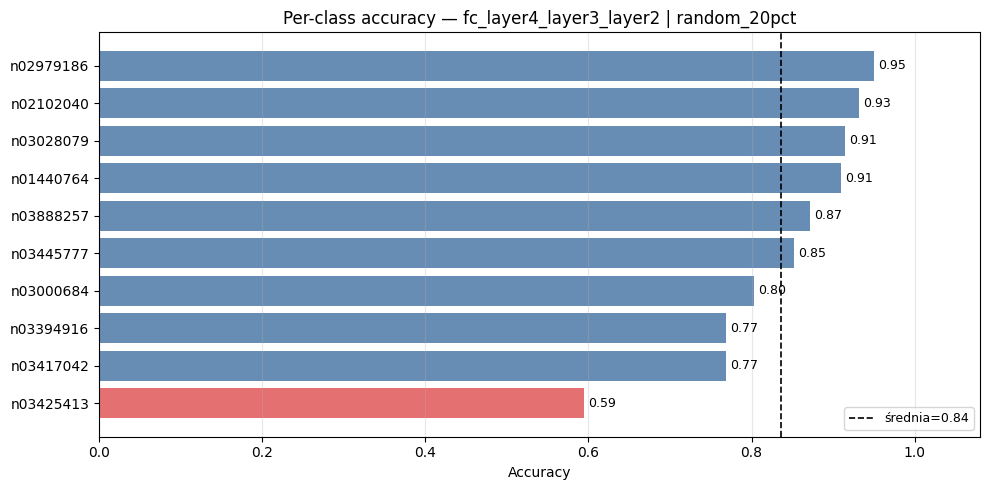

/tmp/ipykernel_57/3634920454.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


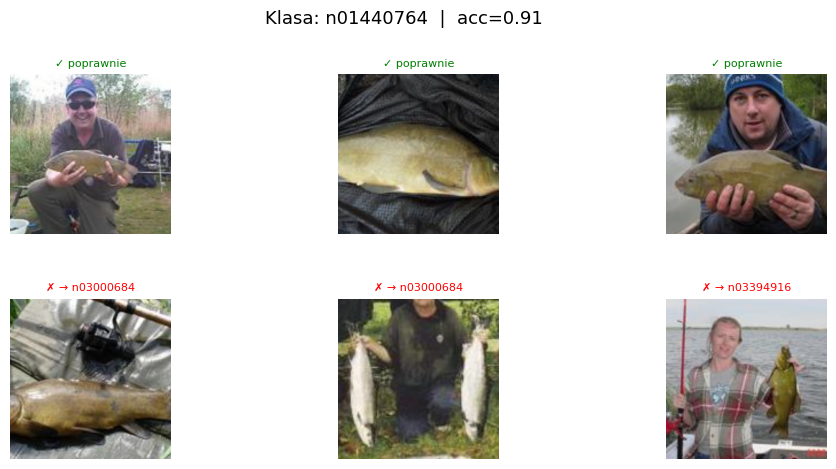

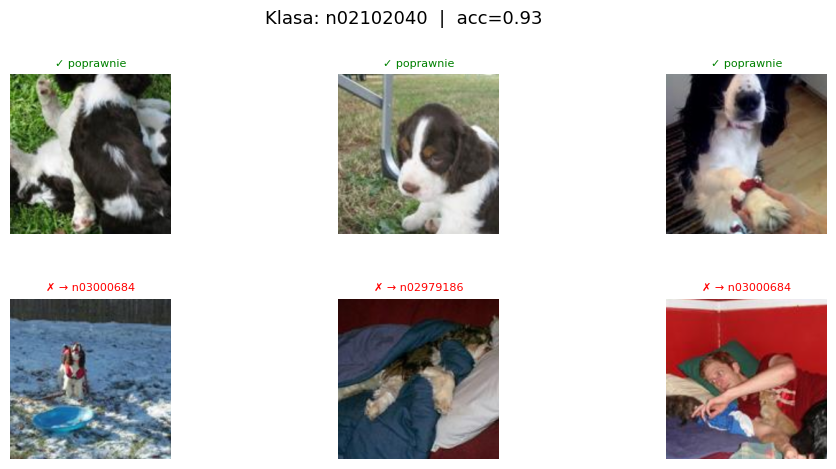

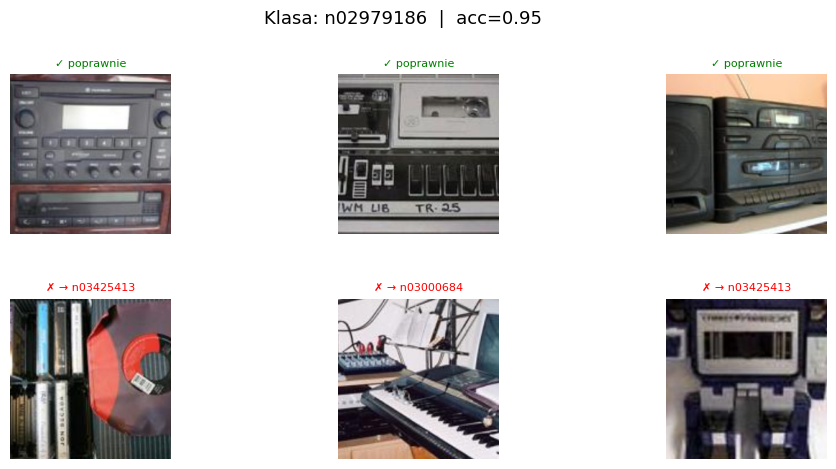

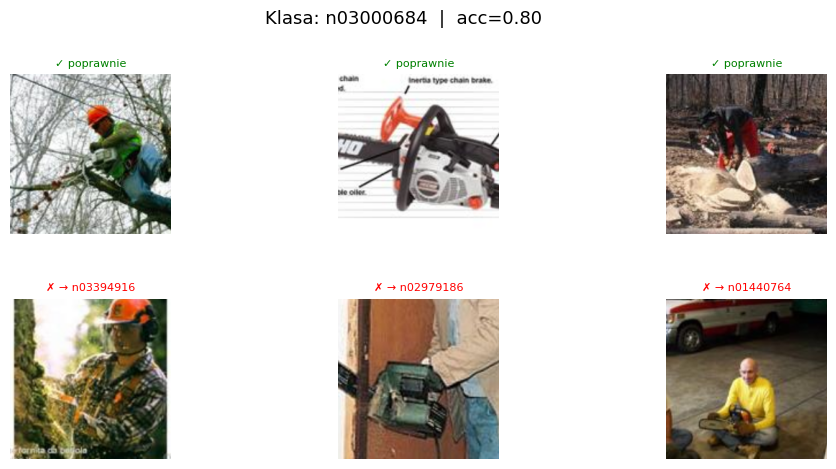

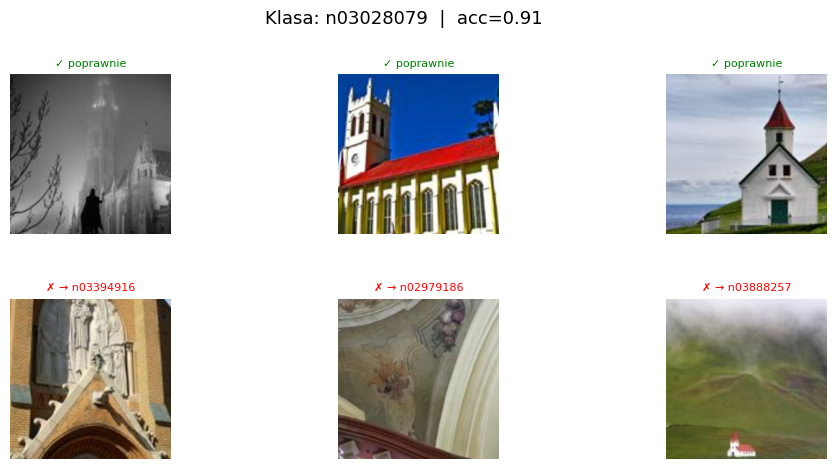

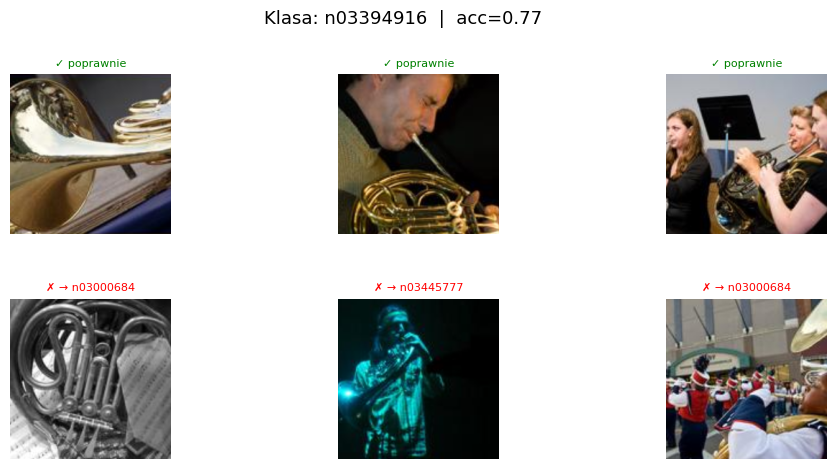

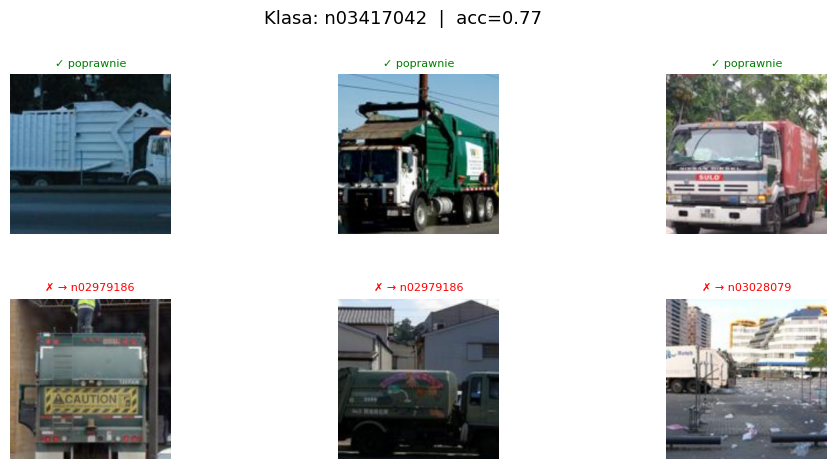

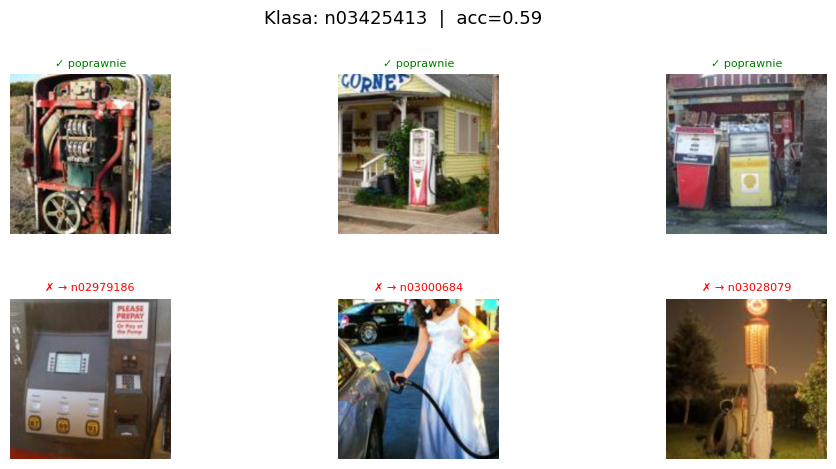

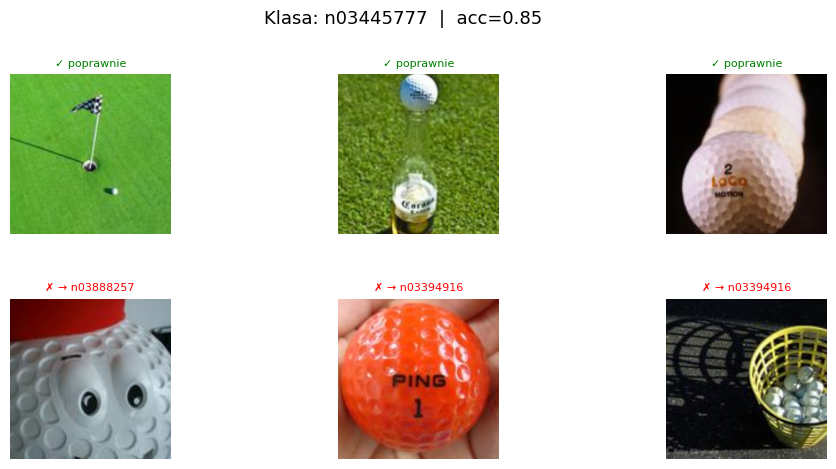

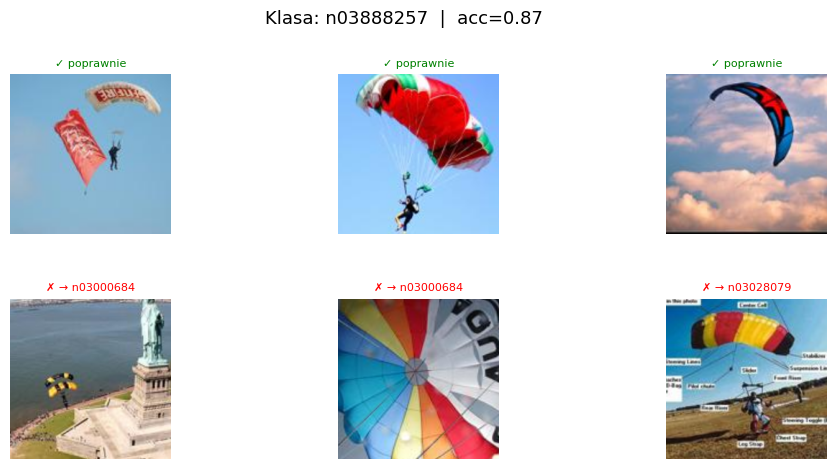

Zapisano perclass_accuracy.png i examples_<klasa>.png dla każdej klasy.


In [29]:
# ══════════════════════════════════════════════════════════════════════════════
# Analiza najlepszego modelu: per-class accuracy + przykłady obrazków
# ══════════════════════════════════════════════════════════════════════════════

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from torch.utils.data import DataLoader
from pathlib import Path

try:
    partial_df
except NameError:
    partial_df = pd.read_csv('results_scratch_partial.csv')

# ── Znajdź najlepszą konfigurację ─────────────────────────────────────────────
best_row = partial_df.loc[partial_df['val_acc'].idxmax()]
best_config = best_row['config']
best_split  = best_row['split']
print(f'Najlepszy model: config={best_config} | split={best_split} | val_acc={best_row["val_acc"]:.4f}')

UNFREEZE_MAP = {
    'fc_only':                  ['fc'],
    'fc_layer4':                ['fc', 'layer4'],
    'fc_layer4_layer3':         ['fc', 'layer4', 'layer3'],
    'fc_layer4_layer3_layer2':  ['fc', 'layer4', 'layer3', 'layer2'],
}

# ── Załaduj najlepszy model ───────────────────────────────────────────────────
best_model = load_scratch_unfreeze(UNFREEZE_MAP[best_config])
best_model.eval()

# ── Inference na całym val secie ──────────────────────────────────────────────
val_loader_full = DataLoader(
    val_ds, batch_size=64, shuffle=False,
    num_workers=2, pin_memory=True,
)

all_preds  = []
all_labels = []
all_images = []

with torch.inference_mode():
    for images, labels in val_loader_full:
        outputs = best_model(images.to(device))
        preds   = outputs.argmax(dim=1).cpu()
        all_preds.append(preds)
        all_labels.append(labels)
        all_images.append(images)  # trzymamy w CPU

all_preds  = torch.cat(all_preds).numpy()
all_labels = torch.cat(all_labels).numpy()
all_images = torch.cat(all_images)  # (N, C, H, W)

CLASS_NAMES = val_ds.classes

# ── Per-class accuracy ────────────────────────────────────────────────────────
class_correct = np.zeros(len(CLASS_NAMES))
class_total   = np.zeros(len(CLASS_NAMES))

for label, pred in zip(all_labels, all_preds):
    class_total[label]   += 1
    class_correct[label] += int(label == pred)

class_acc = class_correct / class_total

# ── Wykres: per-class accuracy ────────────────────────────────────────────────
order = np.argsort(class_acc)
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.barh(
    [CLASS_NAMES[i] for i in order],
    class_acc[order],
    color=['#e15759' if a < 0.7 else '#4e79a7' for a in class_acc[order]],
    alpha=0.85,
)
ax.bar_label(bars, fmt='%.2f', fontsize=9, padding=3)
ax.axvline(class_acc.mean(), color='black', linestyle='--', linewidth=1.2, label=f'średnia={class_acc.mean():.2f}')
ax.set_xlabel('Accuracy')
ax.set_title(f'Per-class accuracy — {best_config} | {best_split}', fontsize=12)
ax.set_xlim(0, 1.08)
ax.legend(fontsize=9); ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig('perclass_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Denormalizacja obrazków ───────────────────────────────────────────────────
MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
STD  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denorm(tensor):
    img = tensor * STD + MEAN
    return img.permute(1, 2, 0).clamp(0, 1).numpy()

# ── Przykłady: 3 dobrze i 3 źle zaklasyfikowane per klasa ────────────────────
N_EXAMPLES = 3

for cls_idx, cls_name in enumerate(CLASS_NAMES):
    mask     = all_labels == cls_idx
    indices  = np.where(mask)[0]
    correct  = indices[all_preds[indices] == cls_idx]
    wrong    = indices[all_preds[indices] != cls_idx]

    n_correct = min(N_EXAMPLES, len(correct))
    n_wrong   = min(N_EXAMPLES, len(wrong))

    fig = plt.figure(figsize=(4 * N_EXAMPLES, 5))
    fig.suptitle(f'Klasa: {cls_name}  |  acc={class_acc[cls_idx]:.2f}', fontsize=13, y=1.01)

    gs = gridspec.GridSpec(2, N_EXAMPLES, figure=fig, hspace=0.4)

    # górny rząd: dobrze zaklasyfikowane
    for col in range(N_EXAMPLES):
        ax = fig.add_subplot(gs[0, col])
        if col < n_correct:
            ax.imshow(denorm(all_images[correct[col]]))
            ax.set_title('✓ poprawnie', color='green', fontsize=8)
        else:
            ax.axis('off')
        ax.axis('off')

    # dolny rząd: źle zaklasyfikowane
    for col in range(N_EXAMPLES):
        ax = fig.add_subplot(gs[1, col])
        if col < n_wrong:
            wrong_pred = CLASS_NAMES[all_preds[wrong[col]]]
            ax.imshow(denorm(all_images[wrong[col]]))
            ax.set_title(f'✗ → {wrong_pred}', color='red', fontsize=8)
        else:
            ax.axis('off')
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(f'examples_{cls_name}.png', dpi=120, bbox_inches='tight')
    plt.show()

print('Zapisano perclass_accuracy.png i examples_<klasa>.png dla każdej klasy.')

In [30]:
# ══════════════════════════════════════════════════════════════════════════════
# Places365 frozen: HKM-DINO 20% vs HKM-ResNet 20%
# ══════════════════════════════════════════════════════════════════════════════

import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import DataLoader, Subset

EPOCHS     = 10
BATCH_SIZE = 64

# ── Loadery ───────────────────────────────────────────────────────────────────
idx_hkm_dino_20   = all_subsets[('hkm_dino',   0.20)]
idx_hkm_resnet_20 = all_subsets[('hkm_resnet', 0.20)]
idx_random_20 = all_subsets[('random', 0.20)]

loaders_cfg = [
    ('hkm_dino_20pct',   DataLoader(Subset(train_model_ds, idx_hkm_dino_20),
                                    batch_size=BATCH_SIZE, shuffle=True,
                                    num_workers=2, pin_memory=True), len(idx_hkm_dino_20)),
    ('hkm_resnet_20pct', DataLoader(Subset(train_model_ds, idx_hkm_resnet_20),
                                    batch_size=BATCH_SIZE, shuffle=True,
                                    num_workers=2, pin_memory=True), len(idx_hkm_resnet_20)),
    ('random_20pct',     DataLoader(Subset(train_model_ds, idx_random_20),
                                    batch_size=BATCH_SIZE, shuffle=True,
                                    num_workers=2, pin_memory=True), len(idx_random_20)),
]

# ── Trening ───────────────────────────────────────────────────────────────────
places_results = []

for split_name, loader, n_samples in loaders_cfg:
    exp_name = f'places365_frozen__{split_name}'
    print(f'\n{"="*60}')
    print(f'{exp_name} | n={n_samples}')
    print(f'{"="*60}')

    model     = create_model('places365', frozen=True)
    criterion = nn.CrossEntropyLoss()
    base      = model.module if isinstance(model, nn.DataParallel) else model
    optimizer = torch.optim.AdamW(base.fc.parameters(), lr=1e-3, weight_decay=1e-4)

    for epoch in range(EPOCHS):
        train_one_epoch(model, loader, optimizer, criterion, frozen=True)
        va_loss, va_acc = evaluate(model, val_loader_exp, criterion)
        torch.cuda.empty_cache()

        print(f'  ep {epoch+1:02d}/{EPOCHS} | val_acc={va_acc:.4f} | val_loss={va_loss:.4f}')

        places_results.append(dict(
            experiment=exp_name,
            split=split_name,
            n_samples=n_samples,
            epoch=epoch + 1,
            val_loss=va_loss,
            val_acc=va_acc,
        ))

    del model, optimizer, criterion
    torch.cuda.empty_cache()
    pd.DataFrame(places_results).to_csv('results_places365_frozen.csv', index=False)
    print(f'  ✓ CSV zapisany ({split_name})')

places_df = pd.DataFrame(places_results)
print('\nPodsumowanie:')
print(places_df.groupby('split')[['val_acc']].max().sort_values('val_acc', ascending=False))


places365_frozen__hkm_dino_20pct | n=1894
Downloading: "http://places2.csail.mit.edu/models_places365/resnet50_places365.pth.tar" to /root/.cache/torch/hub/checkpoints/resnet50_places365.pth.tar


100%|██████████| 92.8M/92.8M [00:01<00:00, 53.7MB/s]


  ep 01/10 | val_acc=0.7896 | val_loss=0.8666


  ep 02/10 | val_acc=0.8318 | val_loss=0.5858


  ep 03/10 | val_acc=0.8696 | val_loss=0.4646


  ep 04/10 | val_acc=0.8619 | val_loss=0.4361


  ep 05/10 | val_acc=0.8825 | val_loss=0.3925


  ep 06/10 | val_acc=0.8892 | val_loss=0.3594


  ep 07/10 | val_acc=0.8892 | val_loss=0.3478


  ep 08/10 | val_acc=0.9039 | val_loss=0.3219


  ep 09/10 | val_acc=0.8983 | val_loss=0.3268


  ep 10/10 | val_acc=0.9062 | val_loss=0.3054
  ✓ CSV zapisany (hkm_dino_20pct)

places365_frozen__hkm_resnet_20pct | n=1894


  ep 01/10 | val_acc=0.7427 | val_loss=0.8388


  ep 02/10 | val_acc=0.8869 | val_loss=0.4823


  ep 03/10 | val_acc=0.8989 | val_loss=0.3849


  ep 04/10 | val_acc=0.9039 | val_loss=0.3565


  ep 05/10 | val_acc=0.9154 | val_loss=0.3175


  ep 06/10 | val_acc=0.9108 | val_loss=0.3107


  ep 07/10 | val_acc=0.9121 | val_loss=0.3016


  ep 08/10 | val_acc=0.9246 | val_loss=0.2700


  ep 09/10 | val_acc=0.9246 | val_loss=0.2629


  ep 10/10 | val_acc=0.9218 | val_loss=0.2605
  ✓ CSV zapisany (hkm_resnet_20pct)

places365_frozen__random_20pct | n=1894


  ep 01/10 | val_acc=0.8578 | val_loss=0.6402


  ep 02/10 | val_acc=0.8841 | val_loss=0.4282


  ep 03/10 | val_acc=0.9085 | val_loss=0.3422


  ep 04/10 | val_acc=0.9124 | val_loss=0.3126


  ep 05/10 | val_acc=0.9073 | val_loss=0.3058


  ep 06/10 | val_acc=0.9134 | val_loss=0.2784


  ep 07/10 | val_acc=0.9197 | val_loss=0.2588


  ep 08/10 | val_acc=0.9233 | val_loss=0.2533


  ep 09/10 | val_acc=0.9233 | val_loss=0.2475


  ep 10/10 | val_acc=0.9213 | val_loss=0.2540
  ✓ CSV zapisany (random_20pct)

Podsumowanie:
                   val_acc
split                     
hkm_resnet_20pct  0.924586
random_20pct      0.923312
hkm_dino_20pct    0.906242


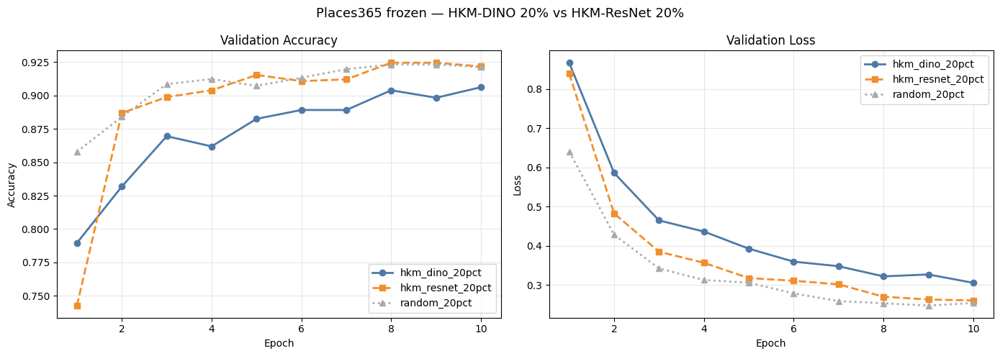

In [31]:
# ── Wykresy ───────────────────────────────────────────────────────────────────

import matplotlib.pyplot as plt

try:
    places_df
except NameError:
    places_df = pd.read_csv('results_places365_frozen.csv')

STYLE = {
    'hkm_dino_20pct':   dict(color='#4e79a7', linestyle='-',  marker='o', linewidth=2),
    'hkm_resnet_20pct': dict(color='#f28e2b', linestyle='--', marker='s', linewidth=2),
    'random_20pct':     dict(color='#aaaaaa', linestyle=':',  marker='^', linewidth=2),
}

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=False)

for split, grp in places_df.groupby('split'):
    axes[0].plot(grp['epoch'], grp['val_acc'],  label=split, **STYLE[split])
    axes[1].plot(grp['epoch'], grp['val_loss'], label=split, **STYLE[split])

axes[0].set_title('Validation Accuracy'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
axes[1].set_title('Validation Loss');     axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
for ax in axes:
    ax.legend(); ax.grid(alpha=0.3)

plt.suptitle('Places365 frozen — HKM-DINO 20% vs HKM-ResNet 20%', fontsize=13)
plt.tight_layout()
plt.savefig('results_places365_frozen.png', dpi=150, bbox_inches='tight')
plt.show()

Inference — HKM-DINO 20%...


Inference — HKM-ResNet 20%...


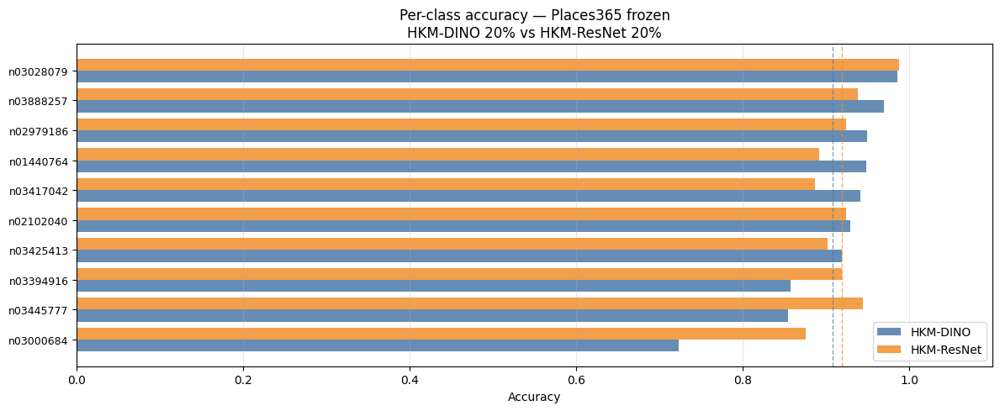

4 najgorsze klasy: ['n03000684', 'n03394916', 'n03445777', 'n03425413']

── Przykłady: hkm_dino ──


/tmp/ipykernel_57/3658935785.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


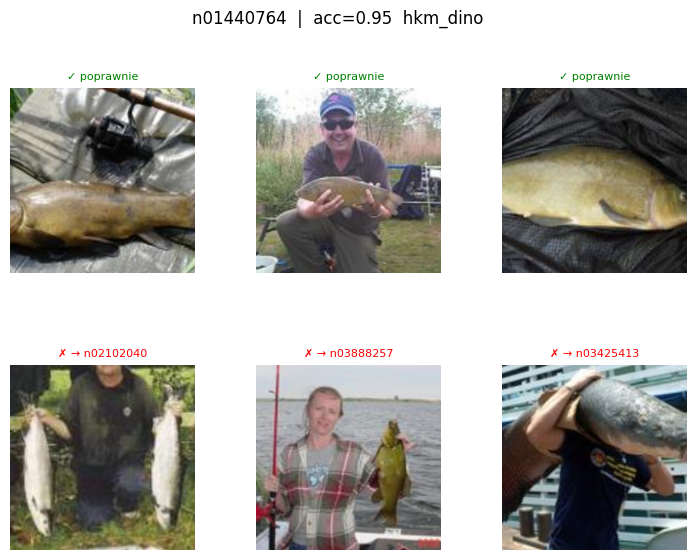

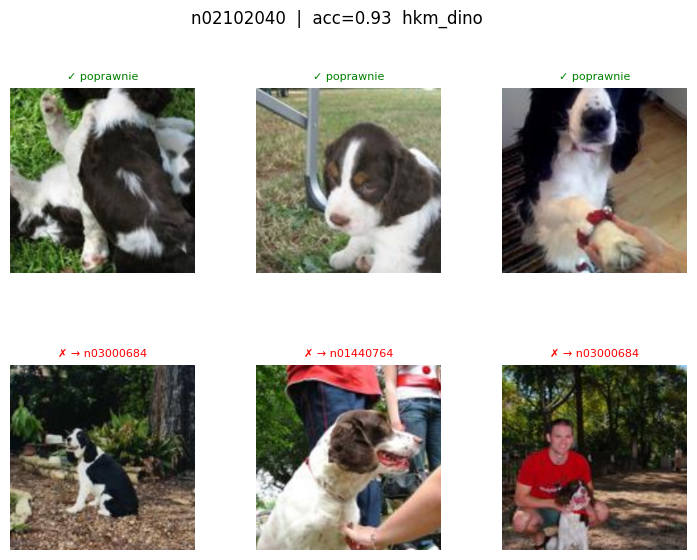

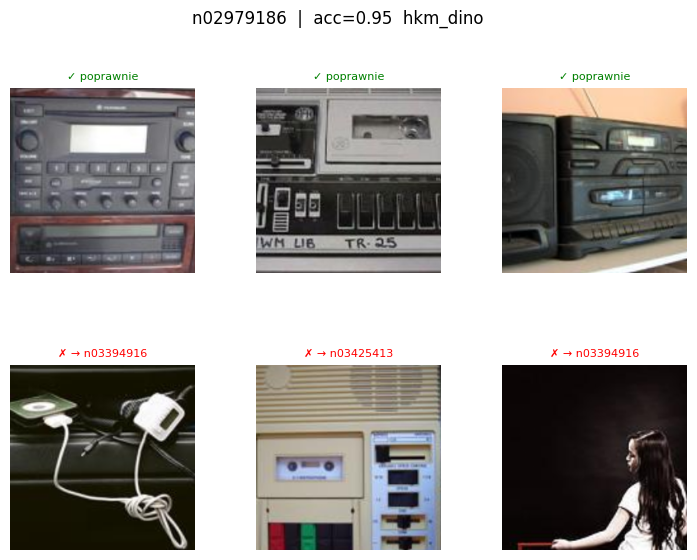

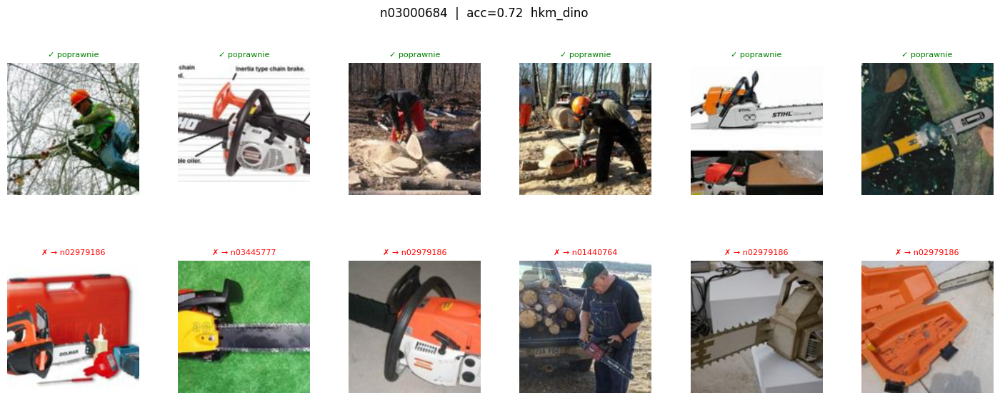

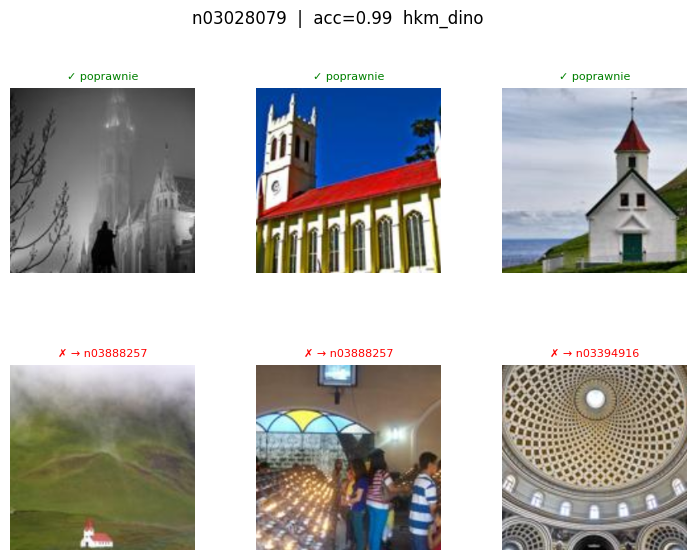

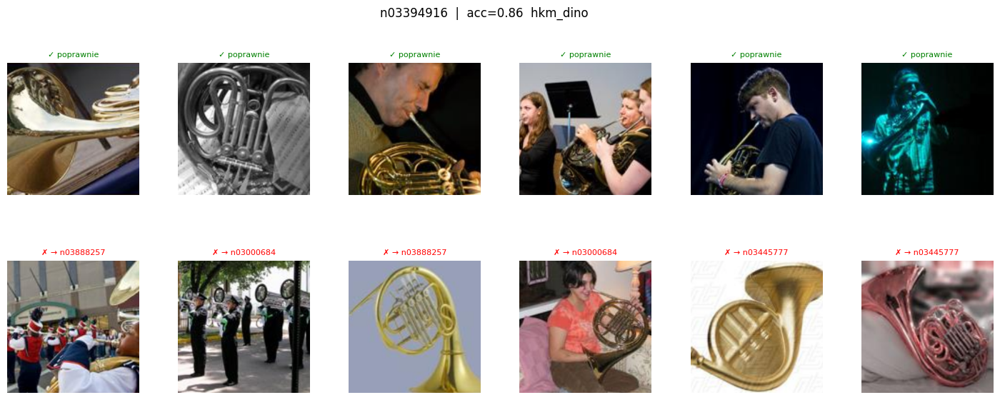

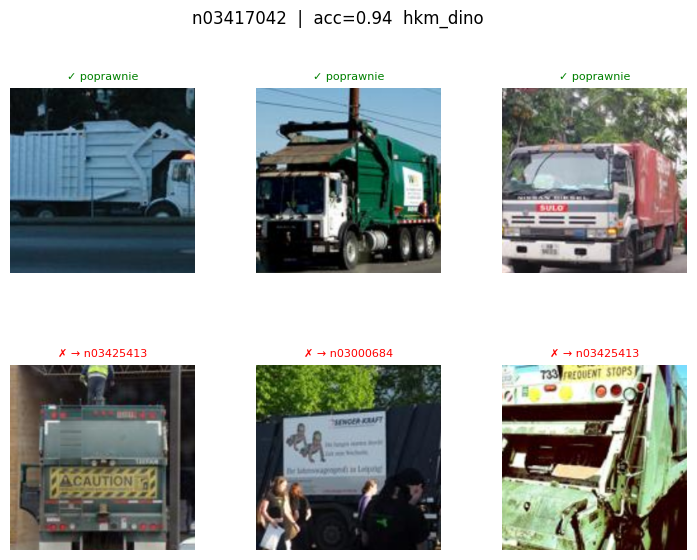

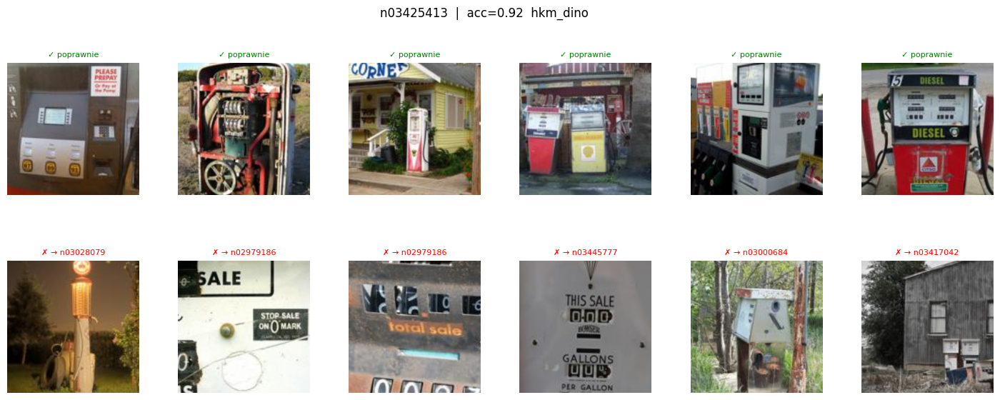

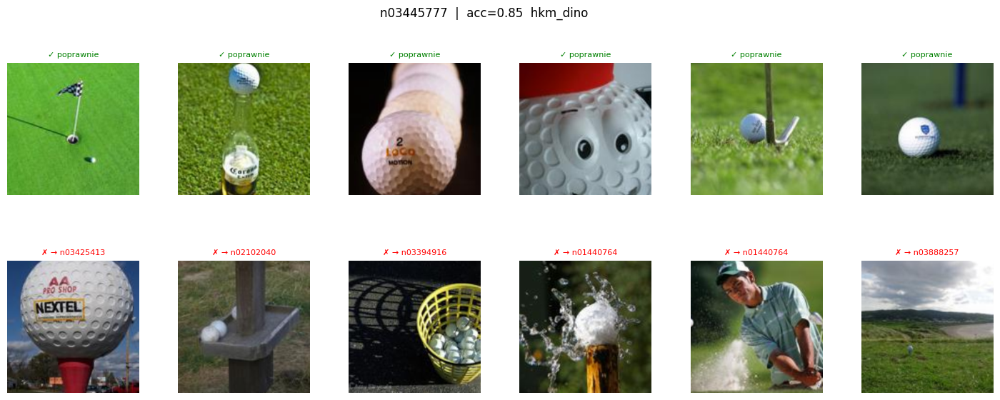

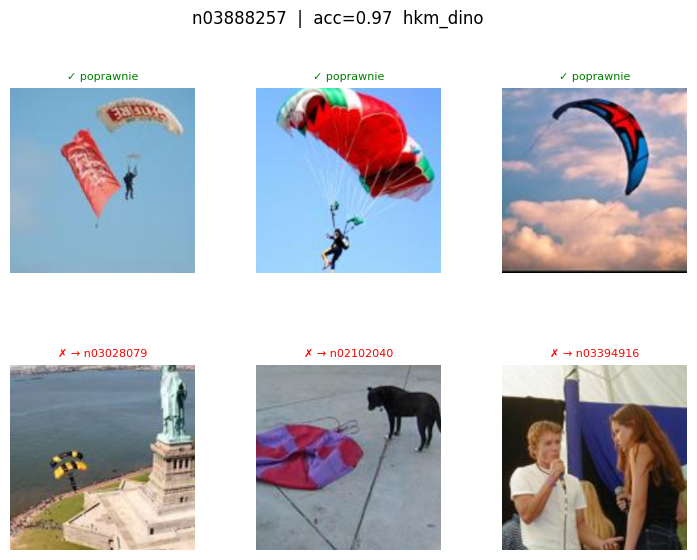


── Przykłady: hkm_resnet ──


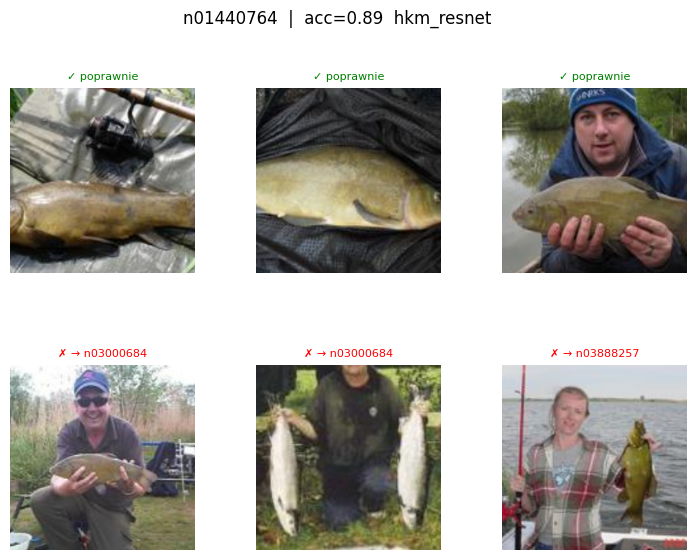

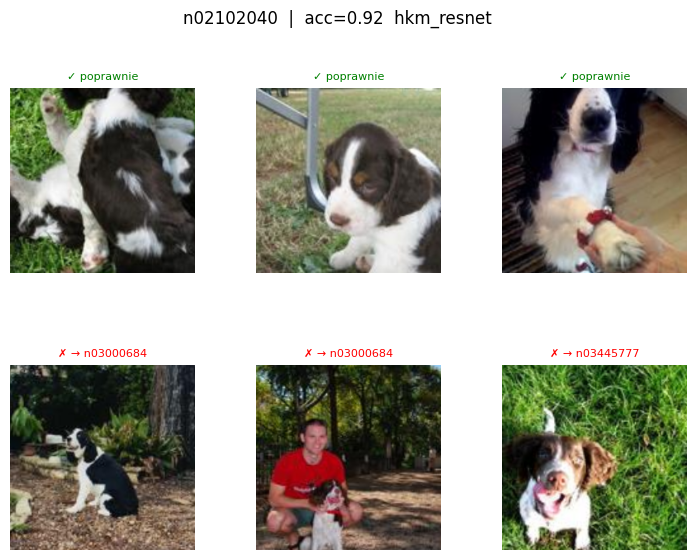

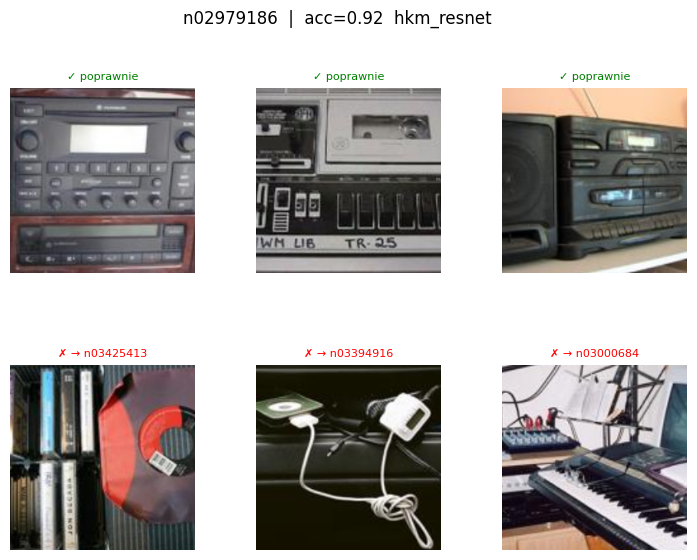

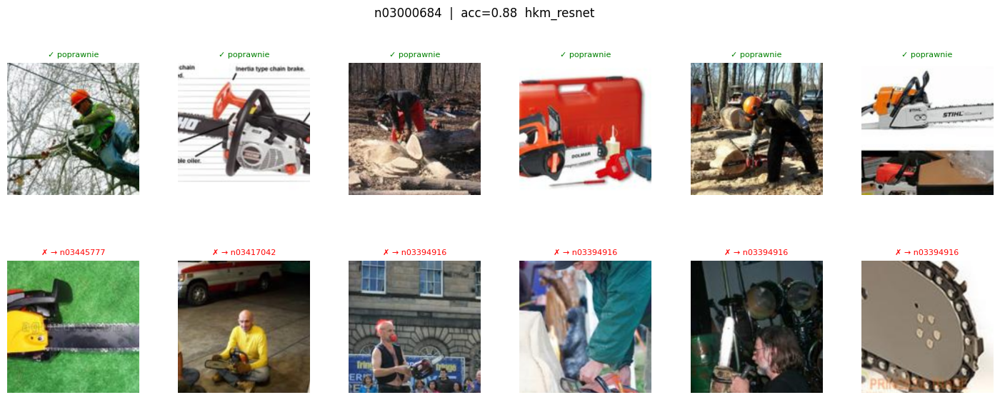

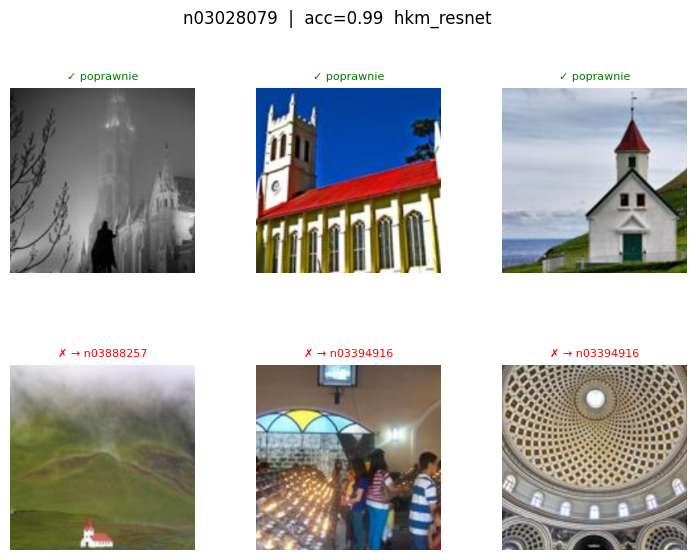

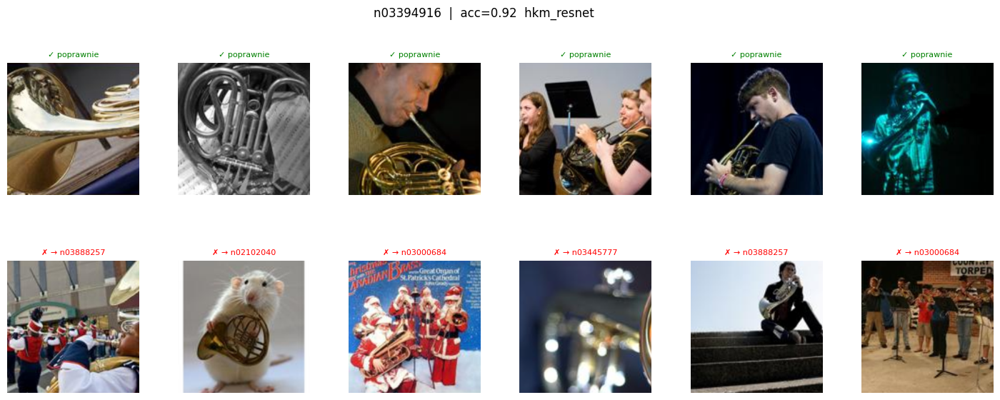

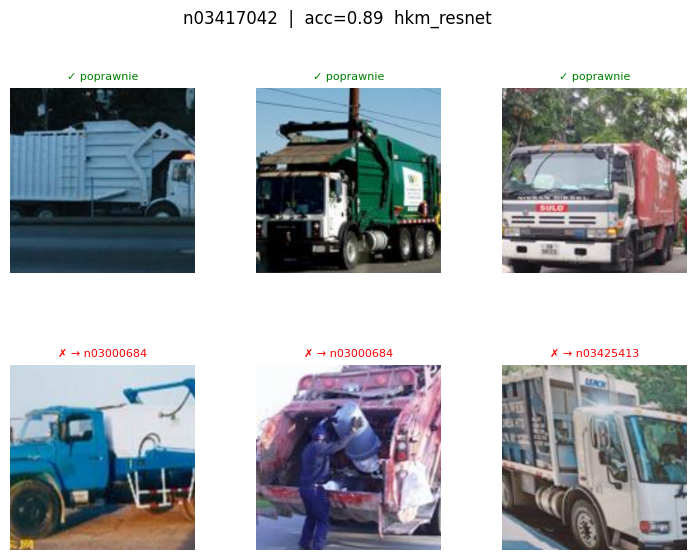

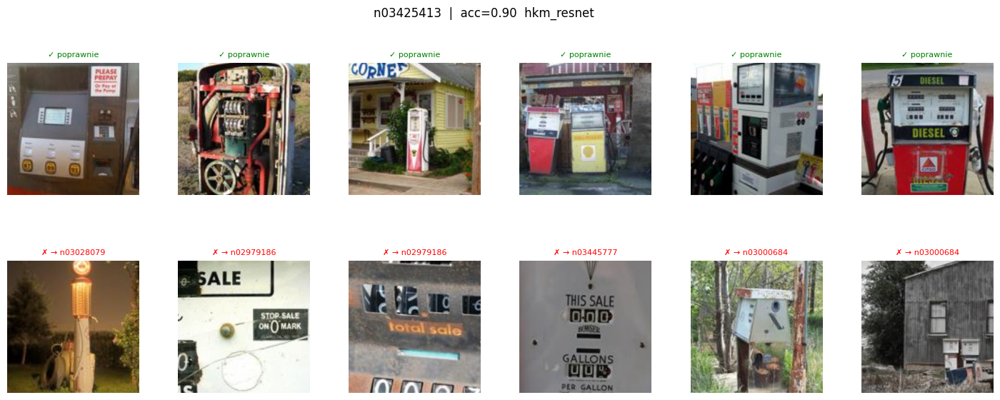

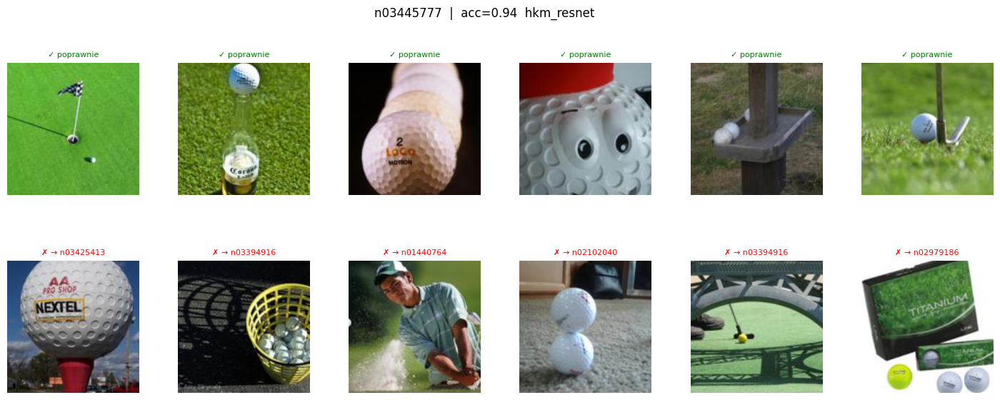

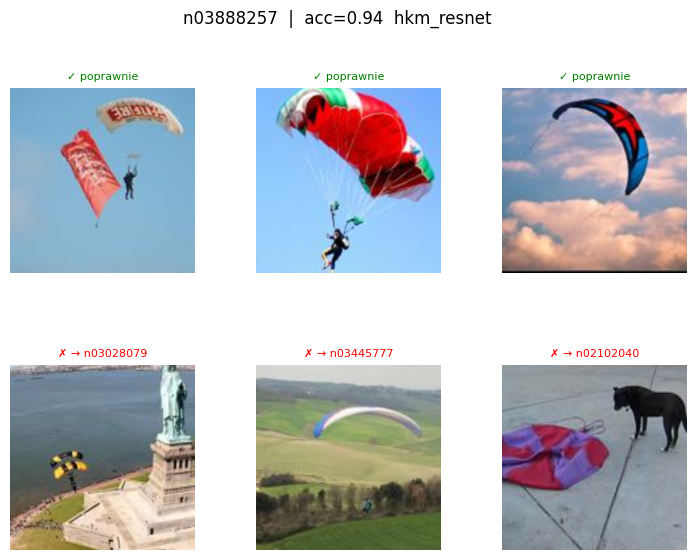

Zapisano wszystkie wykresy.


In [33]:
# ══════════════════════════════════════════════════════════════════════════════
# Analiza Places365 frozen: per-class accuracy + przykłady obrazków
# HKM-DINO 20% vs HKM-ResNet 20%
# ══════════════════════════════════════════════════════════════════════════════

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from torch.utils.data import DataLoader, Subset

BATCH_SIZE  = 64
CLASS_NAMES = val_ds.classes
N_CLASSES   = len(CLASS_NAMES)

MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
STD  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denorm(tensor):
    return (tensor * STD + MEAN).permute(1, 2, 0).clamp(0, 1).numpy()

val_loader_full = DataLoader(
    val_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=2, pin_memory=True,
)

# ── Inference dla obu subsetów ────────────────────────────────────────────────
def run_inference(subset_indices):
    model = create_model('places365', frozen=True)
    base  = model.module if isinstance(model, nn.DataParallel) else model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(base.fc.parameters(), lr=1e-3, weight_decay=1e-4)

    subset_loader = DataLoader(
        Subset(train_model_ds, subset_indices),
        batch_size=BATCH_SIZE, shuffle=True,
        num_workers=2, pin_memory=True,
    )
    for _ in range(EPOCHS):
        train_one_epoch(model, subset_loader, optimizer, criterion, frozen=True)

    model.eval()
    all_preds, all_labels, all_images = [], [], []
    with torch.inference_mode():
        for images, labels in val_loader_full:
            out = model(images.to(device))
            all_preds.append(out.argmax(1).cpu())
            all_labels.append(labels)
            all_images.append(images)

    del model, optimizer, criterion, subset_loader
    torch.cuda.empty_cache()

    return (
        torch.cat(all_preds).numpy(),
        torch.cat(all_labels).numpy(),
        torch.cat(all_images),
    )

print('Inference — HKM-DINO 20%...')
preds_dino, labels, images = run_inference(all_subsets[('hkm_dino',   0.20)])

print('Inference — HKM-ResNet 20%...')
preds_resnet, _, _ = run_inference(all_subsets[('hkm_resnet', 0.20)])

# ── Per-class accuracy ────────────────────────────────────────────────────────
def class_accuracies(preds, labels):
    correct = np.zeros(N_CLASSES)
    total   = np.zeros(N_CLASSES)
    for l, p in zip(labels, preds):
        total[l]   += 1
        correct[l] += int(l == p)
    return correct / total

acc_dino   = class_accuracies(preds_dino,   labels)
acc_resnet = class_accuracies(preds_resnet, labels)

# ── Wykres: per-class accuracy porównanie ─────────────────────────────────────
order = np.argsort(acc_dino)
x     = np.arange(N_CLASSES)
width = 0.4

fig, ax = plt.subplots(figsize=(12, 5))
ax.barh(x - width/2, acc_dino[order],   width, label='HKM-DINO',   color='#4e79a7', alpha=0.85)
ax.barh(x + width/2, acc_resnet[order], width, label='HKM-ResNet', color='#f28e2b', alpha=0.85)
ax.set_yticks(x)
ax.set_yticklabels([CLASS_NAMES[i] for i in order], fontsize=9)
ax.axvline(acc_dino.mean(),   color='#4e79a7', linestyle='--', linewidth=1, alpha=0.7)
ax.axvline(acc_resnet.mean(), color='#f28e2b', linestyle='--', linewidth=1, alpha=0.7)
ax.set_xlabel('Accuracy')
ax.set_title('Per-class accuracy — Places365 frozen\nHKM-DINO 20% vs HKM-ResNet 20%', fontsize=12)
ax.set_xlim(0, 1.1)
ax.legend(); ax.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig('places365_perclass_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 4 najgorsze klasy (średnio z obu subsetów) ────────────────────────────────
mean_acc    = (acc_dino + acc_resnet) / 2
worst4_idx  = np.argsort(mean_acc)[:4]
print('4 najgorsze klasy:', [CLASS_NAMES[i] for i in worst4_idx])

# ── Funkcja do rysowania przykładów ──────────────────────────────────────────
def plot_examples(cls_idx, preds, labels, images, n_correct, n_wrong, title_suffix=''):
    cls_name = CLASS_NAMES[cls_idx]
    mask     = labels == cls_idx
    indices  = np.where(mask)[0]
    correct  = indices[preds[indices] == cls_idx]
    wrong    = indices[preds[indices] != cls_idx]

    nc = min(n_correct, len(correct))
    nw = min(n_wrong,   len(wrong))
    cols = max(nc, nw, 1)

    fig = plt.figure(figsize=(3 * cols, 6))
    fig.suptitle(
        f'{cls_name}  |  acc={class_accuracies(preds, labels)[cls_idx]:.2f}'
        f'  {title_suffix}',
        fontsize=12, y=1.01,
    )
    gs = gridspec.GridSpec(2, cols, figure=fig, hspace=0.5)

    for col in range(cols):
        ax = fig.add_subplot(gs[0, col])
        if col < nc:
            ax.imshow(denorm(images[correct[col]]))
            ax.set_title('✓ poprawnie', color='green', fontsize=8)
        ax.axis('off')

    for col in range(cols):
        ax = fig.add_subplot(gs[1, col])
        if col < nw:
            wrong_pred = CLASS_NAMES[preds[wrong[col]]]
            ax.imshow(denorm(images[wrong[col]]))
            ax.set_title(f'✗ → {wrong_pred}', color='red', fontsize=8)
        ax.axis('off')

    plt.tight_layout()
    safe_name = cls_name.replace('/', '_')
    plt.savefig(f'places365_examples_{safe_name}_{title_suffix}.png',
                dpi=120, bbox_inches='tight')
    plt.show()

# ── Przykłady dla wszystkich klas (3+3), więcej dla 4 najgorszych (6+6) ───────
for split_name, preds in [('hkm_dino', preds_dino), ('hkm_resnet', preds_resnet)]:
    print(f'\n── Przykłady: {split_name} ──')
    for cls_idx in range(N_CLASSES):
        n = 6 if cls_idx in worst4_idx else 3
        plot_examples(cls_idx, preds, labels, images,
                      n_correct=n, n_wrong=n,
                      title_suffix=split_name)

print('Zapisano wszystkie wykresy.')